In [1]:
import awkward as ak
from coffea.nanoevents import NanoEventsFactory, NanoAODSchema, BaseSchema
import coffea.hist as hist
import numpy as np
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore', category=RuntimeWarning)

/opt/conda/lib/python3.8/site-packages/coffea/util.py:154: FutureWarning: In coffea version v0.8.0 (target date: 31 Dec 2022), this will be an error.
(Set coffea.deprecations_as_errors = True to get a stack trace now.)
ImportError: coffea.hist is deprecated
  warnings.warn(message, FutureWarning)


In [2]:
def plothist(x, y, p):

    def gauss_function(x, a, mean, sigma):
        return a*np.exp(-(x - mean)**2/(2 * sigma**2))

    fig, ax = plt.subplots(figsize=(7,7),)

    ax.plot(x, gauss_function(x, *p))
    ax.plot(x, y, 'ok')

from scipy.optimize import curve_fit

def gaussfit(
    x : np.ndarray,
    y : np.ndarray,
    ):

    def gauss_function(x, a, mean, sigma):
        return a*np.exp(-(x - mean)**2/(2 * sigma**2))

    # initial guess
    mean = 1.0
    sigma = np.sqrt(sum((x - mean)**2) / len(x))

    p, pcov = curve_fit(gauss_function, x, y, p0 = [1, mean, sigma])

    # plot fit
    plothist(x, y, p)

    # parameter error
    perr = np.sqrt(np.diag(pcov))

    return (p, perr)

## First one - 5 epochs ##

In [3]:
fname = '/work/training_output/20220629-153348_model_config_ranger_lr0.005_batch512/predict_output/pred.root'
events = NanoEventsFactory.from_root(fname, treepath='Events', schemaclass=BaseSchema).events()

In [3]:
events.fields

['target_mass',
 'output',
 'event_no',
 'fj_no',
 'fj_pt',
 'fj_mass',
 'fj_n2b1',
 'fj_eta',
 'fj_phi',
 'fj_msd',
 'fj_npfcands',
 'fj_genjet_sdmass',
 'fj_gen_mass',
 'label_QCD_all',
 'label_H_bb',
 'label_H_cc',
 'label_H_qq',
 'sample_isQCD']

In [20]:
len(events.event_no)

516183

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

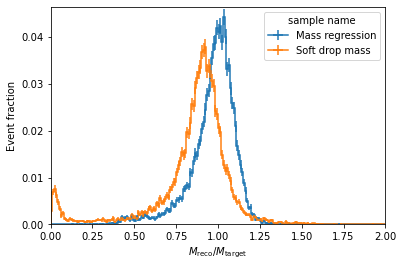

In [5]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'sample name'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[events.fj_gen_mass==targetmass]/events.target_mass[events.fj_gen_mass==targetmass])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[events.fj_gen_mass==targetmass]/events.target_mass[events.fj_gen_mass==targetmass])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[events.fj_gen_mass==targetmass]), 'Soft drop mass': 1/len(events.event_no[events.fj_gen_mass==targetmass])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

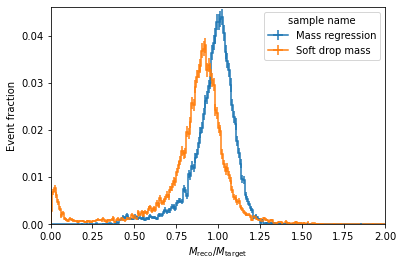

In [8]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'sample name'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[events.fj_gen_mass==targetmass]/events.fj_gen_mass[events.fj_gen_mass==targetmass])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[events.fj_gen_mass==targetmass]/events.fj_gen_mass[events.fj_gen_mass==targetmass])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[events.fj_gen_mass==targetmass]), 'Soft drop mass': 1/len(events.event_no[events.fj_gen_mass==targetmass])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

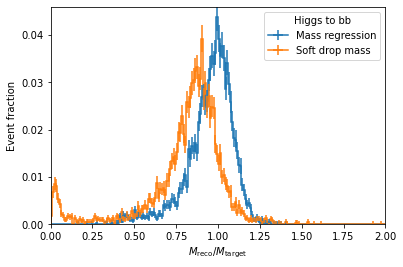

In [32]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to bb'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)]), 'Soft drop mass': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

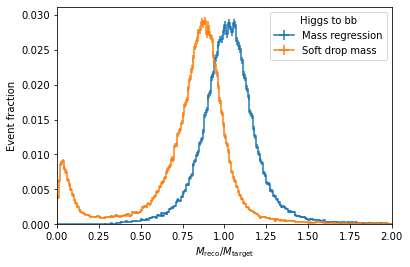

In [11]:
mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to bb'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[events.label_H_bb==1]/events.target_mass[events.label_H_bb==1])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[events.label_H_bb==1]/events.target_mass[events.label_H_bb==1])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[events.label_H_bb==1]), 'Soft drop mass': 1/len(events.event_no[events.label_H_bb==1])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

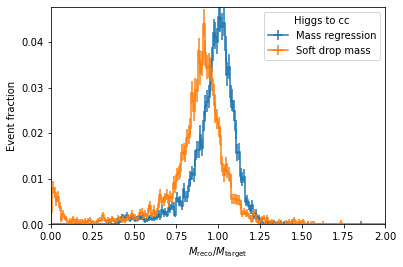

In [33]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to cc'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)]), 'Soft drop mass': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

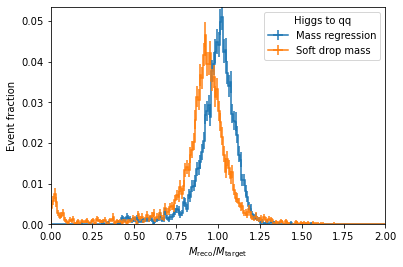

In [34]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to qq'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)]), 'Soft drop mass': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

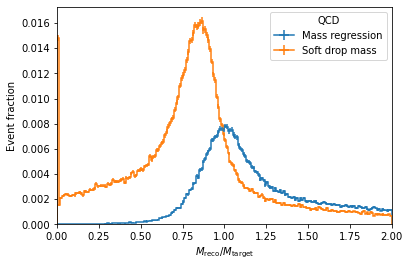

In [4]:
mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'QCD'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[(events.sample_isQCD==1) & (events.label_QCD_all==1)]/events.fj_genjet_sdmass[(events.sample_isQCD==1) & (events.label_QCD_all==1)])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[(events.sample_isQCD==1) & (events.label_QCD_all==1)]/events.fj_genjet_sdmass[(events.sample_isQCD==1) & (events.label_QCD_all==1)])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[(events.sample_isQCD==1) & (events.label_QCD_all==1)]), 'Soft drop mass': 1/len(events.event_no[(events.sample_isQCD==1) & (events.label_QCD_all==1)])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='target_mass', ylabel='test'>

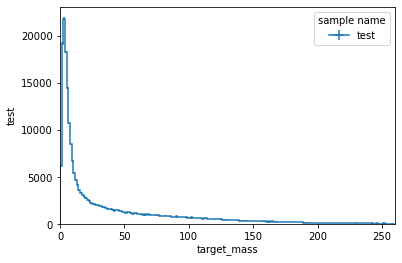

In [14]:
mass = hist.Hist('test',
               hist.Cat('sample', 'sample name'),
               hist.Bin('target_mass', 'target_mass', 200, 0, 260),
              )

mass.fill(sample='test', target_mass=events.fj_genjet_sdmass[(events.sample_isQCD==1) & (events.label_QCD_all==1)])

hist.plot1d(mass, overlay='sample')

In [16]:
print(events.fj_genjet_sdmass[(events.sample_isQCD==1) & (events.label_QCD_all==1)])

[108, 215, 13.1, 147, 8.16, 151, 137, ... 1.34, 5.72, 28.4, 4.11, 35.2, 5.1, 98.3]


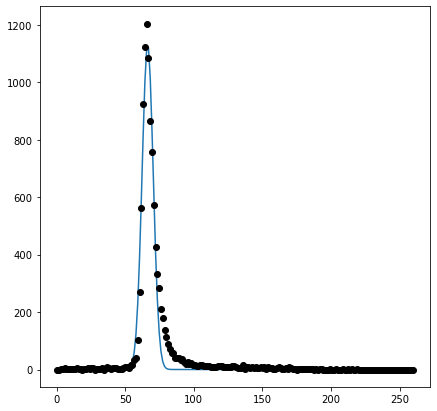

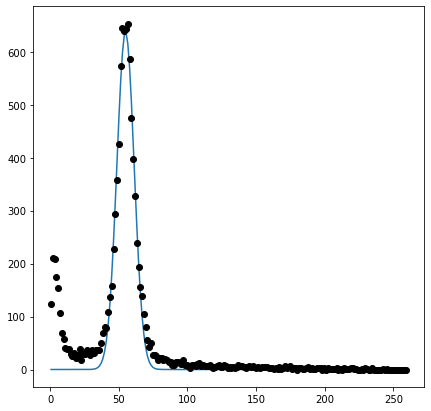

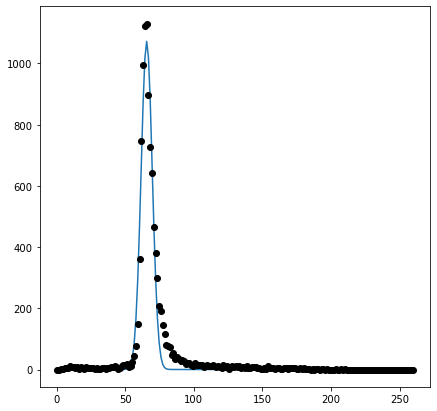

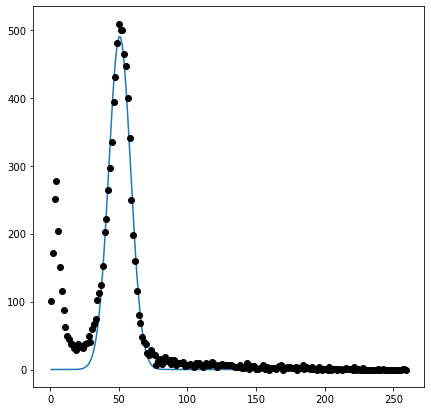

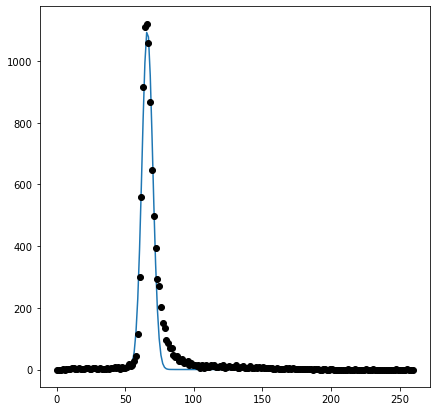

...

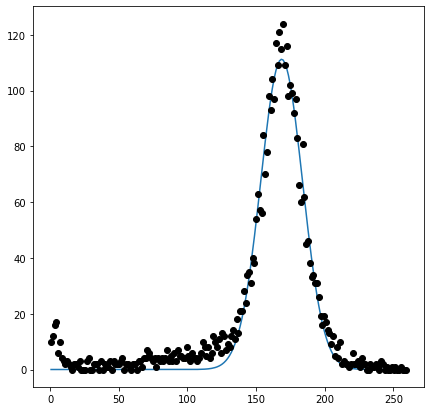

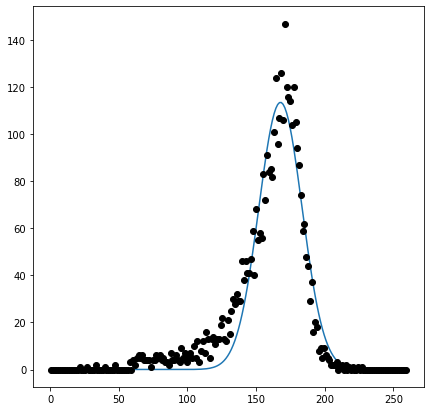

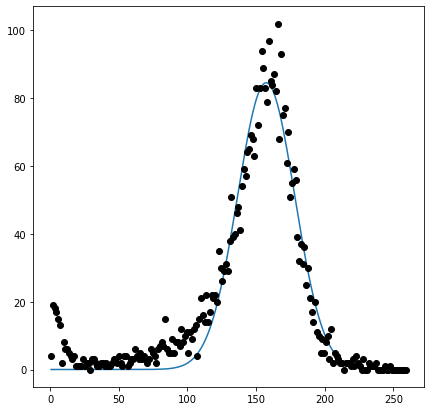

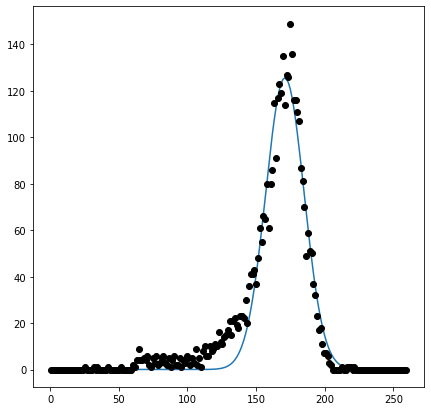

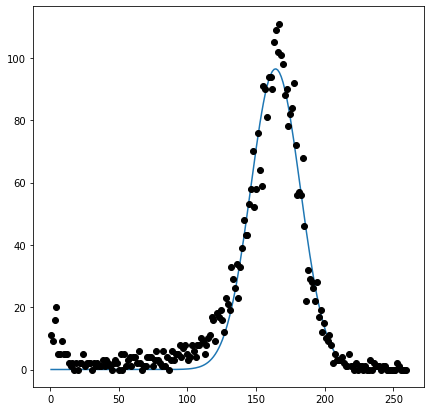

In [15]:
targetmassesH = [60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180]
masshists = {}

for targetmass in targetmassesH:
    masshist = hist.Hist('Events',
                         hist.Cat('sample', 'Higgs to qq'),
                         hist.Bin('mass', 'Mass', 200, 0, 260),
                        )

    masshist.fill(sample='H->qq (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])
    masshist.fill(sample='H->qq (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])
    
    masshist.fill(sample='H->bb (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
    masshist.fill(sample='H->bb (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
    
    masshist.fill(sample='H->cc (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])
    masshist.fill(sample='H->cc (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])
    
    masshists[targetmass] = masshist
    
Hbbr = np.zeros(len(targetmassesH))
Hbbsd = np.zeros(len(targetmassesH))
Hccr = np.zeros(len(targetmassesH))
Hccsd = np.zeros(len(targetmassesH))
Hqqr = np.zeros(len(targetmassesH))
Hqqsd = np.zeros(len(targetmassesH))

Hdict = {'H->bb (regression)': Hbbr, 'H->bb (soft drop)': Hbbsd,
        'H->cc (regression)': Hccr, 'H->cc (soft drop)': Hccsd,
        'H->qq (regression)': Hqqr, 'H->qq (soft drop)': Hqqsd}

for i in range(len(targetmassesH)):
    targetmass = targetmassesH[i]
    masshist = masshists[targetmass]
    x = masshist.axes()[1].centers()
    samplenames = list(masshist.values().keys())
    
    for sample in samplenames:
        y = masshist.values()[sample]
        samplename = sample[0]
        
        p, perr = gaussfit(x, y)
        
        sigma_eff = np.abs(p[2])
        
        Hdict[samplename][i] = sigma_eff/targetmass

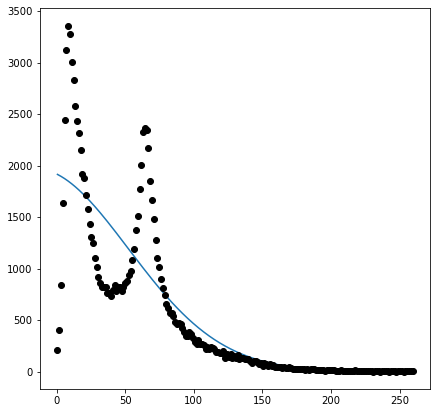

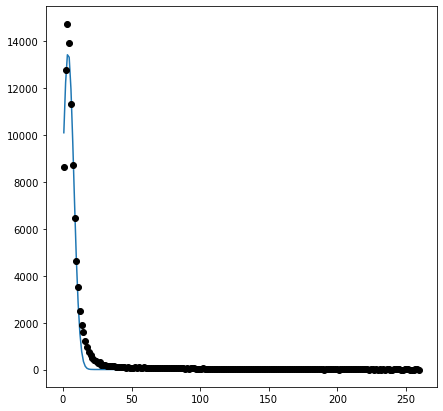

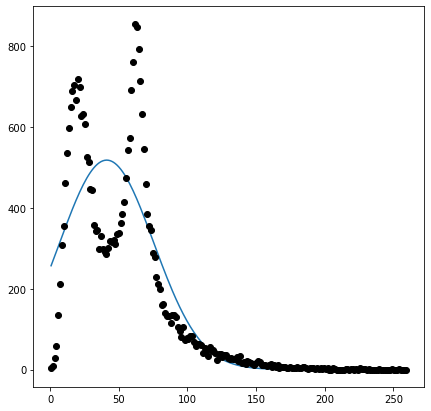

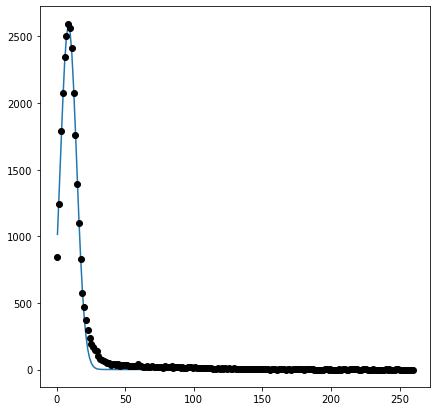

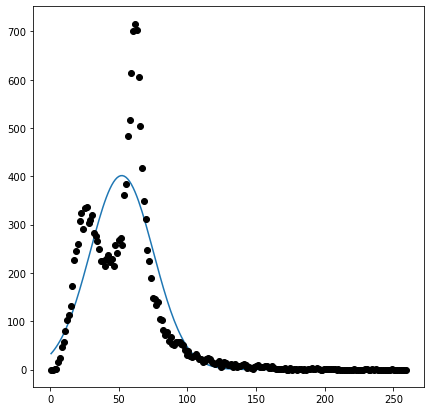

...

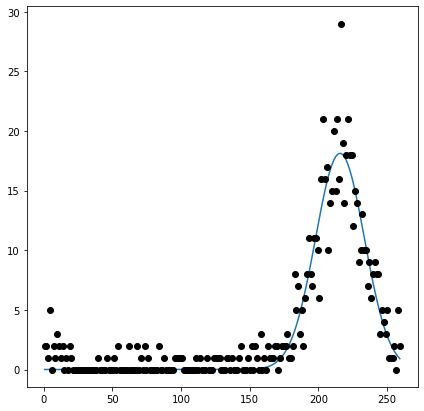

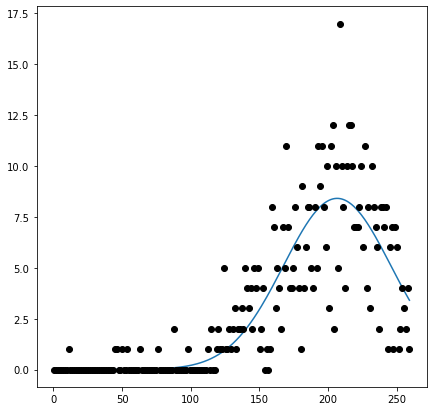

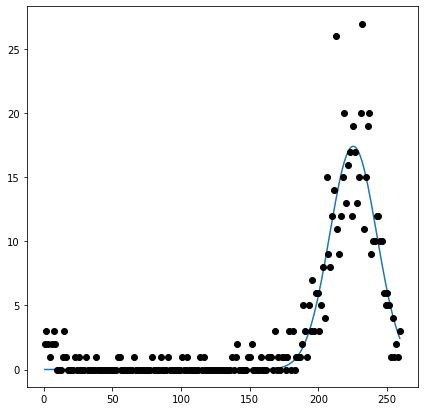

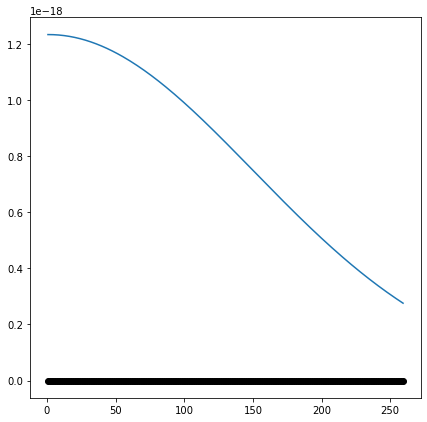

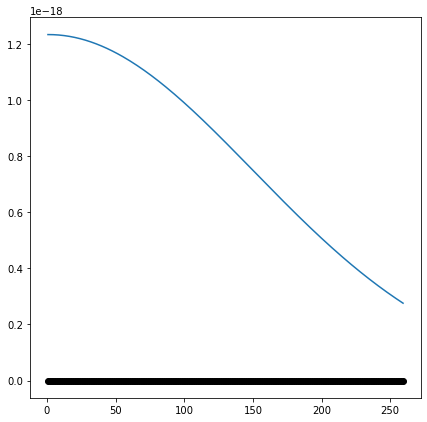

In [19]:
targetmassesQ = np.linspace(0, 260, 27)
masshists = {}

for targetmass in targetmassesQ:
    masshist = hist.Hist('Events',
                         hist.Cat('sample', 'Higgs to qq'),
                         hist.Bin('mass', 'Mass', 200, 0, 260),
                        )

    masshist.fill(sample='QCD (regression)', 
                  mass=events.output[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_genjet_sdmass-targetmass) < 10) & ((events.fj_genjet_sdmass-targetmass) >= 0)])
    masshist.fill(sample='QCD (soft drop)', 
                  mass=events.fj_msd[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_genjet_sdmass-targetmass) < 10) & ((events.fj_genjet_sdmass-targetmass) >= 0)])
    
    masshists[targetmass] = masshist
    
qcdr = np.zeros(len(targetmassesQ))
qcdsd = np.zeros(len(targetmassesQ))

Hdict = {'QCD (regression)': qcdr, 'QCD (soft drop)': qcdsd}

for i in range(len(targetmassesQ)):
    targetmass = targetmassesQ[i]
    masshist = masshists[targetmass]
    x = masshist.axes()[1].centers()
    samplenames = list(masshist.values().keys())
    
    for sample in samplenames:
        y = masshist.values()[sample]
        samplename = sample[0]
        
        p, perr = gaussfit(x, y)
        
        sigma_eff = np.abs(p[2])
        
        Hdict[samplename][i] = sigma_eff/targetmass

In [18]:
print(np.linspace(0, 260, 27))

[  0.  10.  20.  30.  40.  50.  60.  70.  80.  90. 100. 110. 120. 130.
 140. 150. 160. 170. 180. 190. 200. 210. 220. 230. 240. 250. 260.]


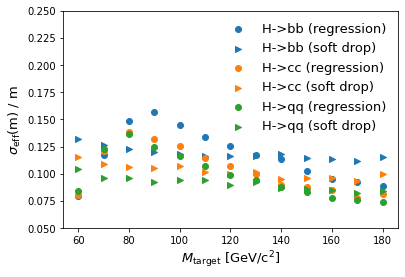

In [7]:
plt.scatter(targetmasses, Hbbr, label='H->bb (regression)', c='C0')
plt.scatter(targetmasses, Hbbsd, label='H->bb (soft drop)', c='C0', marker='>')
plt.scatter(targetmasses, Hccr, label='H->cc (regression)', c='C1')
plt.scatter(targetmasses, Hccsd, label='H->cc (soft drop)', c='C1', marker='>')
plt.scatter(targetmasses, Hqqr, label='H->qq (regression)', c='C2')
plt.scatter(targetmasses, Hqqsd, label='H->qq (soft drop)', c='C2', marker='>')

plt.legend(fontsize=13, frameon=False)
plt.xlabel('$M_{\\rm target}$ [GeV/${\\rm c}^2$]', fontsize=13)
plt.ylabel('$\sigma_{\\rm eff}$(m) / m', fontsize=13)
plt.ylim([0.05, 0.25])
plt.show()

## 10 epochs ##

In [3]:
fname = '/work/training_output/20220630-152645_model_config_ranger_lr0.005_batch512/predict_output/pred.root'
events = NanoEventsFactory.from_root(fname, treepath='Events', schemaclass=BaseSchema).events()

In [4]:
events.fields

['target_mass',
 'output',
 'event_no',
 'fj_no',
 'fj_pt',
 'fj_mass',
 'fj_n2b1',
 'fj_eta',
 'fj_phi',
 'fj_msd',
 'fj_npfcands',
 'fj_genjet_sdmass',
 'fj_gen_mass',
 'label_QCD_all',
 'label_H_bb',
 'label_H_cc',
 'label_H_qq',
 'sample_isQCD']

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

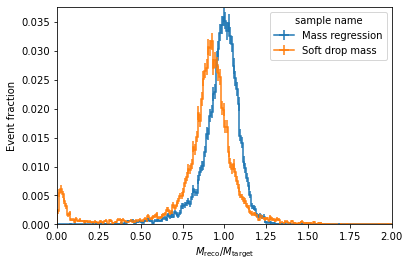

In [5]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'sample name'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[(events.fj_gen_mass==targetmass) & (events.fj_pt>=400)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.fj_pt>=400)])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.fj_pt>=400)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.fj_pt>=400)])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[events.fj_gen_mass==targetmass]), 'Soft drop mass': 1/len(events.event_no[events.fj_gen_mass==targetmass])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

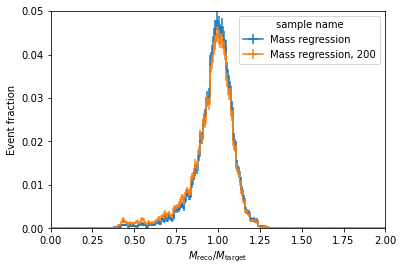

In [9]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'sample name'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression, 200', mass=events.output[(events.fj_gen_mass==targetmass) & (events.fj_pt>=200)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.fj_pt>=200)])
mass.fill(sample='Mass regression', mass=events.output[(events.fj_gen_mass==targetmass) & (events.fj_pt>=400)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.fj_pt>=400)])
# mass.fill(sample='Soft drop mass', mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.fj_pt>=200)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.fj_pt>=200)])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression, 200': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.fj_pt>=200)]), 'Mass regression': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.fj_pt>=400)])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

In [6]:
fname = '/work/training_output/20220629-153348_model_config_ranger_lr0.005_batch512/predict_output/pred.root'
events5 = NanoEventsFactory.from_root(fname, treepath='Events', schemaclass=BaseSchema).events()

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

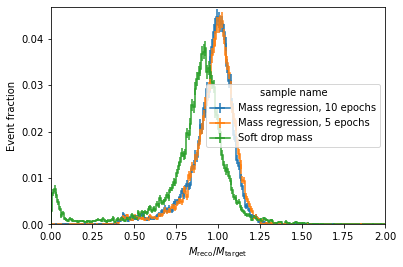

In [12]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'sample name'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression, 10 epochs', mass=events.output[events.fj_gen_mass==targetmass]/events.target_mass[events.fj_gen_mass==targetmass])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[events.fj_gen_mass==targetmass]/events.target_mass[events.fj_gen_mass==targetmass])
mass.fill(sample='Mass regression, 5 epochs', mass=events5.output[events5.fj_gen_mass==targetmass]/events5.target_mass[events5.fj_gen_mass==targetmass])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression, 10 epochs': 1/len(events.event_no[events.fj_gen_mass==targetmass]), 'Mass regression, 5 epochs': 1/len(events5.event_no[events5.fj_gen_mass==targetmass]), 'Soft drop mass': 1/len(events.event_no[events.fj_gen_mass==targetmass])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

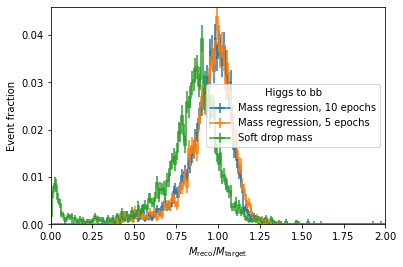

In [14]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to bb'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression, 10 epochs', mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
mass.fill(sample='Mass regression, 5 epochs', mass=events5.output[(events5.fj_gen_mass==targetmass) & (events5.label_H_bb==1)]/events5.target_mass[(events5.fj_gen_mass==targetmass) & (events5.label_H_bb==1)])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression, 10 epochs': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)]), 'Mass regression, 5 epochs': 1/len(events5.event_no[(events5.fj_gen_mass==targetmass) & (events5.label_H_bb==1)]), 'Soft drop mass': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

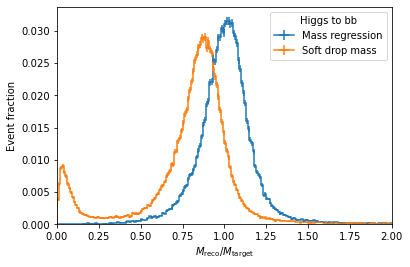

In [6]:
mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to bb'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[events.label_H_bb==1]/events.target_mass[events.label_H_bb==1])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[events.label_H_bb==1]/events.target_mass[events.label_H_bb==1])
# mass.fill(sample='Mass regression, 5 epochs', mass=events5.output[events5.label_H_bb==1]/events5.target_mass[events5.label_H_bb==1])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[events.label_H_bb==1]), 'Soft drop mass': 1/len(events.event_no[events.label_H_bb==1])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

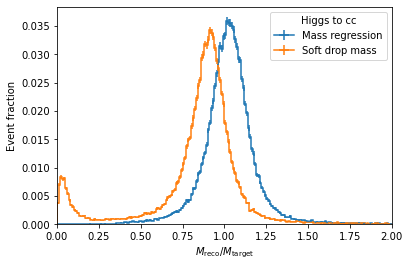

In [33]:
mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to cc'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[events.label_H_cc==1]/events.target_mass[events.label_H_cc==1])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[events.label_H_cc==1]/events.target_mass[events.label_H_cc==1])
# mass.fill(sample='Mass regression, 5 epochs', mass=events5.output[events5.label_H_bb==1]/events5.target_mass[events5.label_H_bb==1])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[events.label_H_cc==1]), 'Soft drop mass': 1/len(events.event_no[events.label_H_cc==1])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

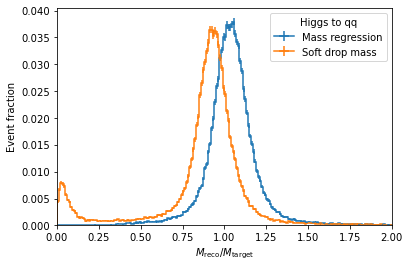

In [5]:
mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to qq'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[events.label_H_qq==1]/events.target_mass[events.label_H_qq==1])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[events.label_H_qq==1]/events.target_mass[events.label_H_qq==1])
# mass.fill(sample='Mass regression, 5 epochs', mass=events5.output[events5.label_H_bb==1]/events5.target_mass[events5.label_H_bb==1])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[events.label_H_qq==1]), 'Soft drop mass': 1/len(events.event_no[events.label_H_qq==1])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

In [13]:
values = mass.values()[('Mass regression',)]
# print(values)
maxvalue = np.argmax(values)
# index = values.index(maxvalue)
print(maxvalue)
centers = mass.to_hist().axes['mass'].centers
print(centers[maxvalue])

105
1.055


/opt/conda/lib/python3.8/site-packages/hist/basehist.py:110: UserWarning: sample is a protected keyword and cannot be used as axis name
  warnings.warn(disallowed_warning)


<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

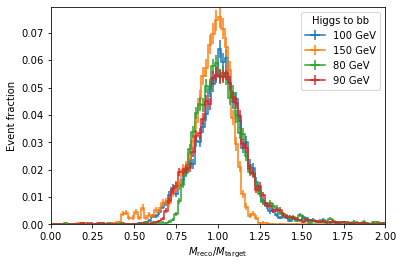

In [32]:
mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to bb'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 100, 0, 2),
                )

mass.fill(sample='150 GeV', 
          mass=events.output[(events.fj_gen_mass==150) & (events.label_H_bb==1)]/events.target_mass[(events.fj_gen_mass==150) & (events.label_H_bb==1)])

mass.fill(sample='100 GeV', 
          mass=events.output[(events.fj_gen_mass==100) & (events.label_H_bb==1)]/events.target_mass[(events.fj_gen_mass==100) & (events.label_H_bb==1)])

mass.fill(sample='90 GeV', 
          mass=events.output[(events.fj_gen_mass==90) & (events.label_H_bb==1)]/events.target_mass[(events.fj_gen_mass==90) & (events.label_H_bb==1)])

mass.fill(sample='80 GeV', 
          mass=events.output[(events.fj_gen_mass==80) & (events.label_H_bb==1)]/events.target_mass[(events.fj_gen_mass==80) & (events.label_H_bb==1)])

# am not sure this is the correct way to do events fraction
scales = {'150 GeV': 1/len(events.event_no[(events.fj_gen_mass==150) & (events.label_H_bb==1)]), 
          '100 GeV': 1/len(events.event_no[(events.fj_gen_mass==100) & (events.label_H_bb==1)]), 
          '90 GeV': 1/len(events.event_no[(events.fj_gen_mass==90) & (events.label_H_bb==1)]), 
          '80 GeV': 1/len(events.event_no[(events.fj_gen_mass==80) & (events.label_H_bb==1)]), 
         }
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

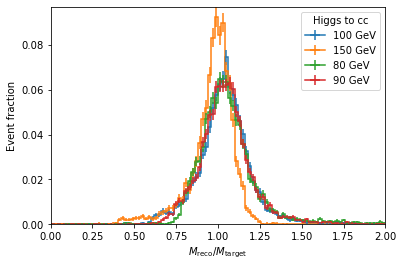

In [35]:
mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to cc'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 100, 0, 2),
                )

mass.fill(sample='150 GeV', 
          mass=events.output[(events.fj_gen_mass==150) & (events.label_H_cc==1)]/events.target_mass[(events.fj_gen_mass==150) & (events.label_H_cc==1)])

mass.fill(sample='100 GeV', 
          mass=events.output[(events.fj_gen_mass==100) & (events.label_H_cc==1)]/events.target_mass[(events.fj_gen_mass==100) & (events.label_H_cc==1)])

mass.fill(sample='90 GeV', 
          mass=events.output[(events.fj_gen_mass==90) & (events.label_H_cc==1)]/events.target_mass[(events.fj_gen_mass==90) & (events.label_H_cc==1)])

mass.fill(sample='80 GeV', 
          mass=events.output[(events.fj_gen_mass==80) & (events.label_H_cc==1)]/events.target_mass[(events.fj_gen_mass==80) & (events.label_H_cc==1)])

# am not sure this is the correct way to do events fraction
scales = {'150 GeV': 1/len(events.event_no[(events.fj_gen_mass==150) & (events.label_H_cc==1)]), 
          '100 GeV': 1/len(events.event_no[(events.fj_gen_mass==100) & (events.label_H_cc==1)]), 
          '90 GeV': 1/len(events.event_no[(events.fj_gen_mass==90) & (events.label_H_cc==1)]), 
          '80 GeV': 1/len(events.event_no[(events.fj_gen_mass==80) & (events.label_H_cc==1)]), 
         }
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

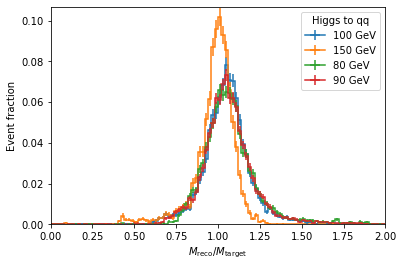

In [36]:
mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to qq'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 100, 0, 2),
                )

mass.fill(sample='150 GeV', 
          mass=events.output[(events.fj_gen_mass==150) & (events.label_H_qq==1)]/events.target_mass[(events.fj_gen_mass==150) & (events.label_H_qq==1)])

mass.fill(sample='100 GeV', 
          mass=events.output[(events.fj_gen_mass==100) & (events.label_H_qq==1)]/events.target_mass[(events.fj_gen_mass==100) & (events.label_H_qq==1)])

mass.fill(sample='90 GeV', 
          mass=events.output[(events.fj_gen_mass==90) & (events.label_H_qq==1)]/events.target_mass[(events.fj_gen_mass==90) & (events.label_H_qq==1)])

mass.fill(sample='80 GeV', 
          mass=events.output[(events.fj_gen_mass==80) & (events.label_H_qq==1)]/events.target_mass[(events.fj_gen_mass==80) & (events.label_H_qq==1)])

# am not sure this is the correct way to do events fraction
scales = {'150 GeV': 1/len(events.event_no[(events.fj_gen_mass==150) & (events.label_H_qq==1)]), 
          '100 GeV': 1/len(events.event_no[(events.fj_gen_mass==100) & (events.label_H_qq==1)]), 
          '90 GeV': 1/len(events.event_no[(events.fj_gen_mass==90) & (events.label_H_qq==1)]), 
          '80 GeV': 1/len(events.event_no[(events.fj_gen_mass==80) & (events.label_H_qq==1)]), 
         }
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

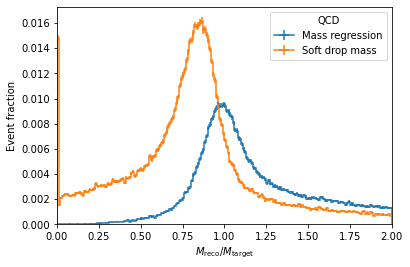

In [10]:
mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'QCD'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[(events.sample_isQCD==1) & (events.label_QCD_all==1)]/events.fj_genjet_sdmass[(events.sample_isQCD==1) & (events.label_QCD_all==1)])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[(events.sample_isQCD==1) & (events.label_QCD_all==1)]/events.fj_genjet_sdmass[(events.sample_isQCD==1) & (events.label_QCD_all==1)])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[(events.sample_isQCD==1) & (events.label_QCD_all==1)]), 'Soft drop mass': 1/len(events.event_no[(events.sample_isQCD==1) & (events.label_QCD_all==1)])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

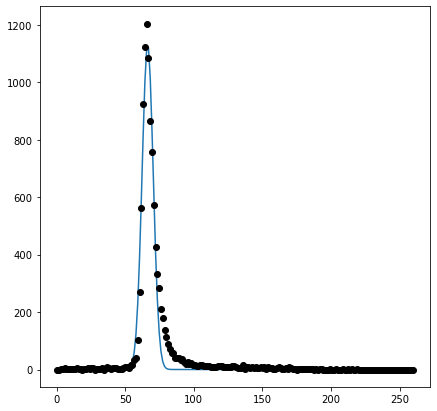

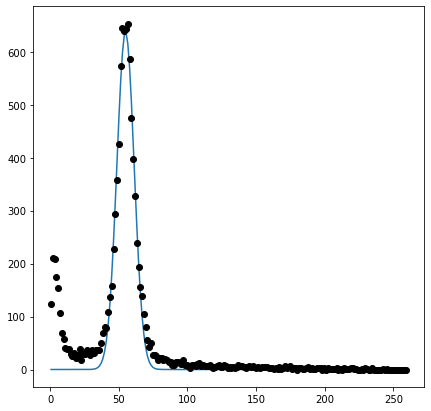

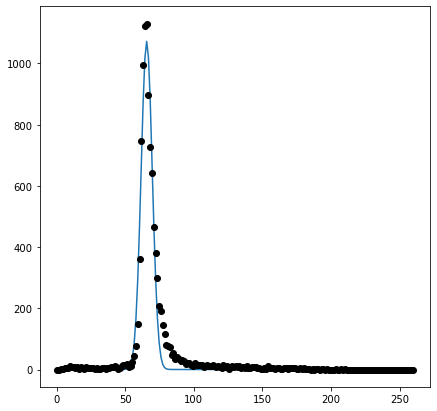

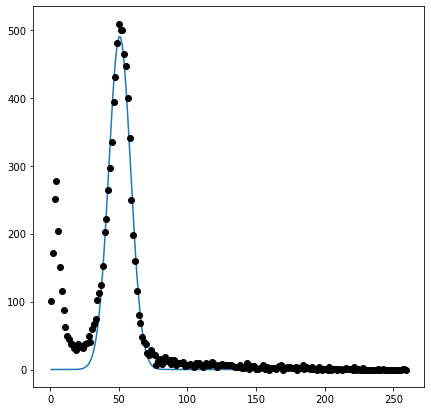

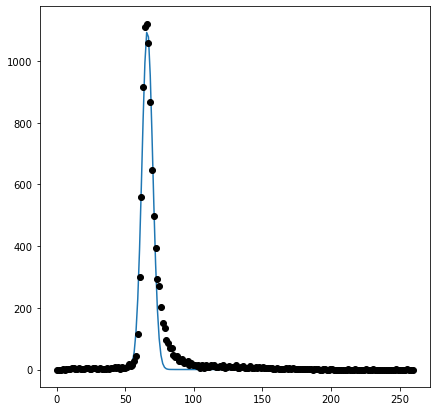

...

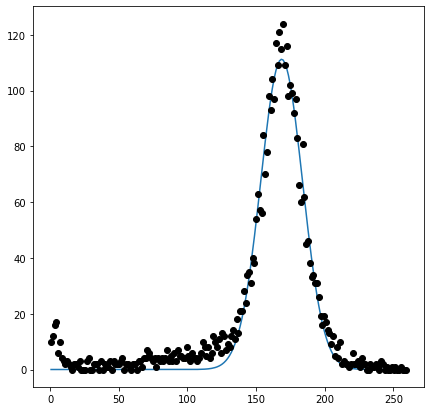

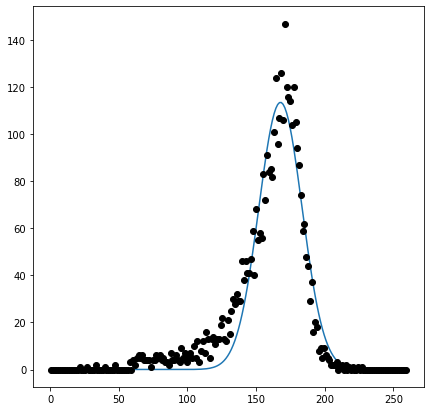

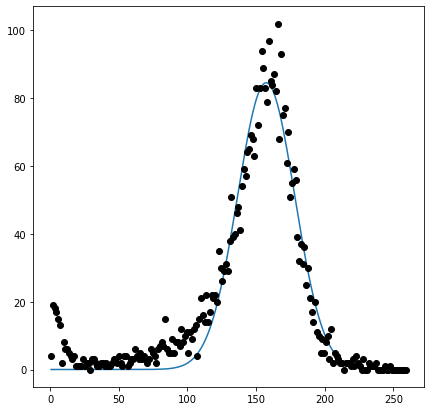

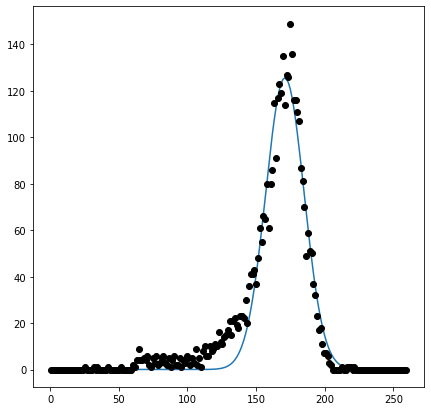

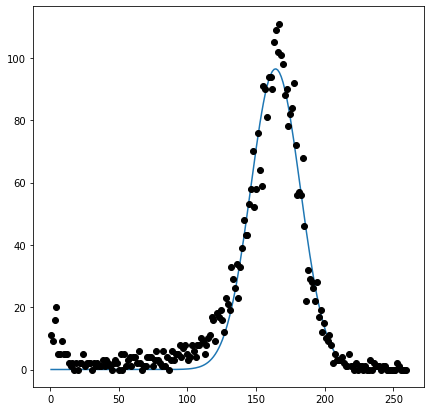

In [20]:
# ignore - old
targetmassesH = [60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180]
masshists = {}

for targetmass in targetmassesH:
    masshist = hist.Hist('Events',
                         hist.Cat('sample', 'Higgs to qq'),
                         hist.Bin('mass', 'Mass', 200, 0, 260),
                        )

    masshist.fill(sample='H->qq (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])
    masshist.fill(sample='H->qq (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])
    
    masshist.fill(sample='H->bb (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
    masshist.fill(sample='H->bb (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
    
    masshist.fill(sample='H->cc (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])
    masshist.fill(sample='H->cc (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])
    
    masshists[targetmass] = masshist
    
Hbbr = np.zeros(len(targetmassesH))
Hbbsd = np.zeros(len(targetmassesH))
Hccr = np.zeros(len(targetmassesH))
Hccsd = np.zeros(len(targetmassesH))
Hqqr = np.zeros(len(targetmassesH))
Hqqsd = np.zeros(len(targetmassesH))

Hdict = {'H->bb (regression)': Hbbr, 'H->bb (soft drop)': Hbbsd,
        'H->cc (regression)': Hccr, 'H->cc (soft drop)': Hccsd,
        'H->qq (regression)': Hqqr, 'H->qq (soft drop)': Hqqsd}

for i in range(len(targetmassesH)):
    targetmass = targetmassesH[i]
    masshist = masshists[targetmass]
    x = masshist.axes()[1].centers()
    samplenames = list(masshist.values().keys())
    
    for sample in samplenames:
        y = masshist.values()[sample]
        samplename = sample[0]
        
        p, perr = gaussfit(x, y)
        
        sigma_eff = np.abs(p[2])
        
        Hdict[samplename][i] = sigma_eff/targetmass

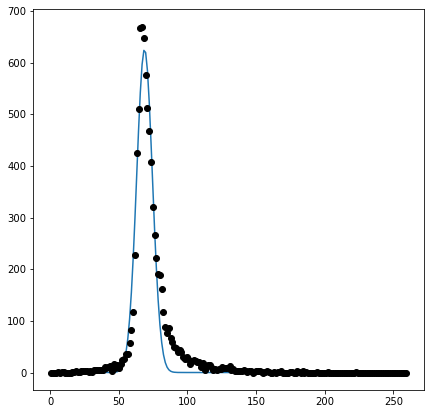

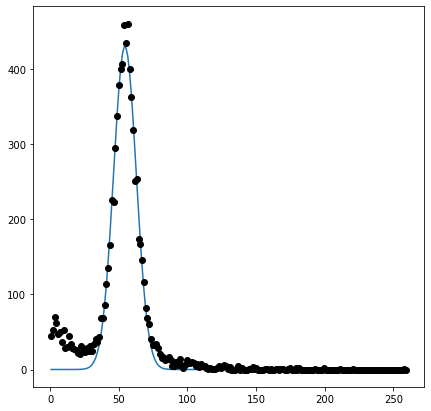

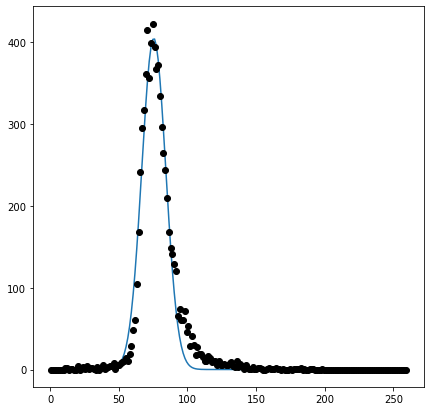

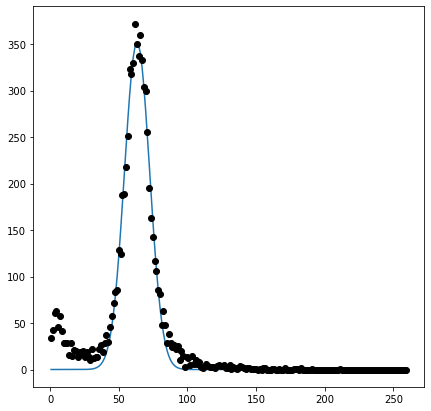

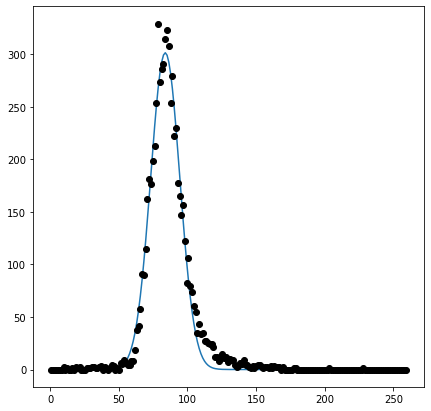

...

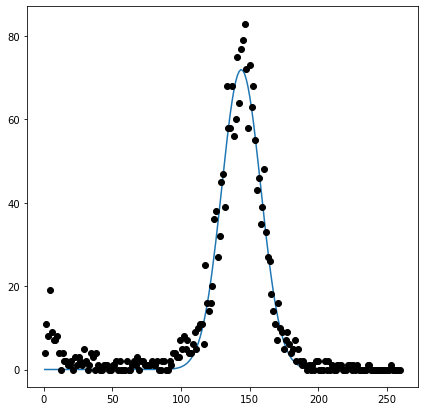

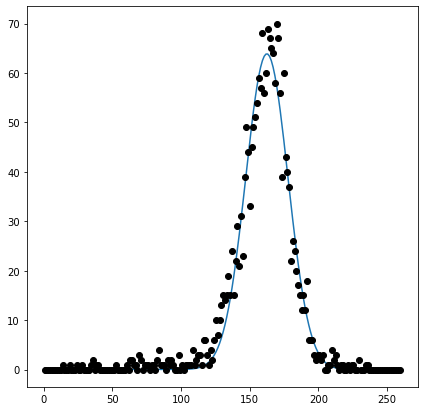

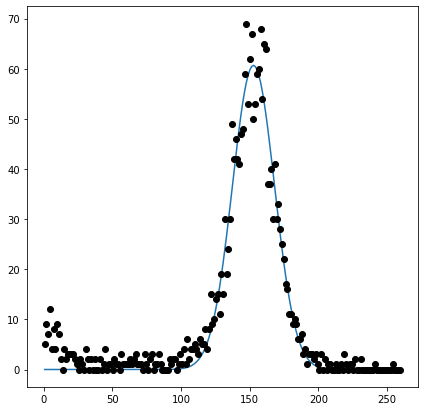

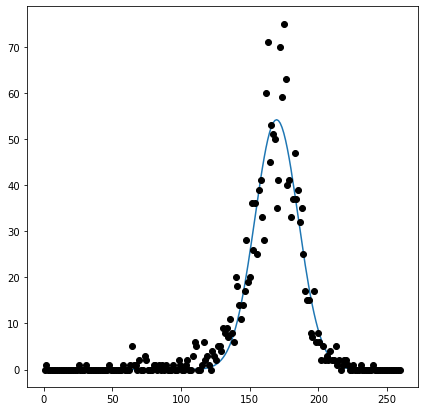

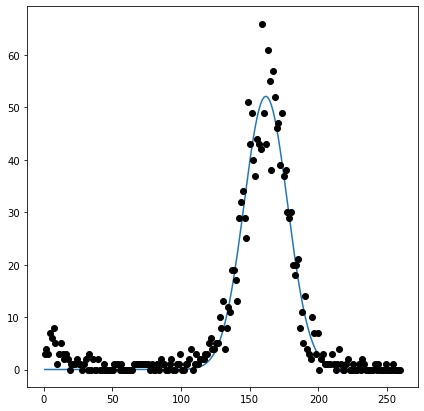

In [24]:
# ignore - old
targetmassesQ = [60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180]
masshists = {}

for targetmass in targetmassesQ:
    masshist = hist.Hist('Events',
                         hist.Cat('sample', 'Higgs to qq'),
                         hist.Bin('mass', 'Mass', 200, 0, 260),
                        )

    masshist.fill(sample='QCD (regression)', 
                  mass=events.output[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_genjet_sdmass-targetmass) < 10) & ((events.fj_genjet_sdmass-targetmass) >= 0)])
    masshist.fill(sample='QCD (soft drop)', 
                  mass=events.fj_msd[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_genjet_sdmass-targetmass) < 10) & ((events.fj_genjet_sdmass-targetmass) >= 0)])
    
    masshists[targetmass] = masshist
    
qcdr = np.zeros(len(targetmassesQ))
qcdsd = np.zeros(len(targetmassesQ))

Hdict = {'QCD (regression)': qcdr, 'QCD (soft drop)': qcdsd}

for i in range(len(targetmassesQ)):
    targetmass = targetmassesQ[i]
    masshist = masshists[targetmass]
    x = masshist.axes()[1].centers()
    samplenames = list(masshist.values().keys())
    
    for sample in samplenames:
        y = masshist.values()[sample]
        samplename = sample[0]
        
        p, perr = gaussfit(x, y)
        
        sigma_eff = np.abs(p[2])
        
        Hdict[samplename][i] = sigma_eff/targetmass

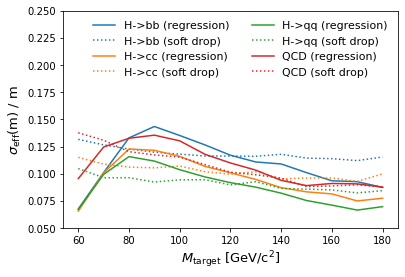

In [29]:
# ignore - old
plt.plot(targetmassesH, Hbbr, label='H->bb (regression)', c='C0')
plt.plot(targetmassesH, Hbbsd, label='H->bb (soft drop)', c='C0', ls=':')
plt.plot(targetmassesH, Hccr, label='H->cc (regression)', c='C1')
plt.plot(targetmassesH, Hccsd, label='H->cc (soft drop)', c='C1', ls=':')
plt.plot(targetmassesH, Hqqr, label='H->qq (regression)', c='C2')
plt.plot(targetmassesH, Hqqsd, label='H->qq (soft drop)', c='C2', ls=':')
plt.plot(targetmassesQ, qcdr, label='QCD (regression)', c='C3')
plt.plot(targetmassesQ, qcdsd, label='QCD (soft drop)', c='C3', ls=':')
plt.legend(fontsize=11, frameon=False, ncol=2)
plt.xlabel('$M_{\\rm target}$ [GeV/${\\rm c}^2$]', fontsize=13)
plt.ylabel('$\sigma_{\\rm eff}$(m) / m', fontsize=13)
plt.ylim([0.05, 0.25])
plt.show()

In [28]:
# function for computing mass resolution
def getEffSigma(theHist, wmin=0.2, wmax=180, epsilon=0.01):

    point = wmin
    weight = 0.0
    points = []
    # number of all jets
    thesum = theHist.sum("sample", "mass").values()[()]

    # number of jets in each bin
    values = theHist.sum("sample").values()[()]

    # bin centers
    centers = theHist.to_hist().axes['mass'].centers

    # fill list of bin centers and the integral up to those points
    for i, value in enumerate(values):
        weight += value
        points.append([centers[i], weight / thesum])

    low = wmin
    high = wmax

    # loop over all possible bin combninations and find the one
    # with smallest width and ~68% of all jets
    width = wmax - wmin
    for i in range(len(points)):
        for j in range(i, len(points)):
            wy = points[j][1] - points[i][1]
#             print(wy)
            if abs(wy - 0.683) < epsilon:
#                 print("here")
                wx = points[j][0] - points[i][0]
#                 print(wx)
                if wx < width:
                    low = points[i][0]
                    high = points[j][0]
                    # print(points[j][0], points[i][0], wy, wx)
                    width = wx
    print(low, high)
    return 0.5 * (high - low)

targetmasses = np.array([60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180])
Hbbr = np.zeros(len(targetmasses))
Hbbsd = np.zeros(len(targetmasses))
Hccr = np.zeros(len(targetmasses))
Hccsd = np.zeros(len(targetmasses))
Hqqr = np.zeros(len(targetmasses))
Hqqsd = np.zeros(len(targetmasses))
qcdr = np.zeros(len(targetmasses))
qcdsd = np.zeros(len(targetmasses))

for i in range(len(targetmasses)):
    targetmass = targetmasses[i]
    
    # hbbr
    hbbrhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 260)
                        )

    hbbrhist.fill(sample='H->bb (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])#/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])

    Hbbr[i] = getEffSigma(hbbrhist)/targetmass
    
    # hbbsd
    hbbsdhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 260)
                        )

    hbbsdhist.fill(sample='H->bb (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])#/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])

    Hbbsd[i] = getEffSigma(hbbsdhist)/targetmass
    
    # hccr
    hccrhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 260)
                        )

    hccrhist.fill(sample='H->cc (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])#/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])

    Hccr[i] = getEffSigma(hccrhist)/targetmass
    
    # hccsd
    hccsdhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 260)
                        )

    hccsdhist.fill(sample='H->cc (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])#/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])

    Hccsd[i] = getEffSigma(hccsdhist)/targetmass
    
    # hqqr
    hqqrhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 260)
                        )

    hqqrhist.fill(sample='H->qq (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])#/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])

    Hqqr[i] = getEffSigma(hqqrhist)/targetmass
    
    # hccsd
    hqqsdhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 260)
                        )

    hqqsdhist.fill(sample='H->qq (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])#/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])

    Hqqsd[i] = getEffSigma(hqqsdhist)/targetmass
    
    #qcdr
    qcdrhist = hist.Hist('Events',
                         hist.Cat('sample', 'sample name'),
                         hist.Bin('mass', 'Mass', 200, 0, 260),
                        )

    qcdrhist.fill(sample='QCD (regression)', 
                  mass=events.output[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_genjet_sdmass-targetmass) < 10) & ((events.fj_genjet_sdmass-targetmass) >= 0)])#/events.fj_genjet_sdmass[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_genjet_sdmass-targetmass) < 10) & ((events.fj_genjet_sdmass-targetmass) >= 0)])
    
    qcdr[i] = getEffSigma(qcdrhist)/targetmass
    
    #qcdsd
    qcdsdhist = hist.Hist('Events',
                         hist.Cat('sample', 'sample name'),
                         hist.Bin('mass', 'Mass', 200, 0, 260),
                        )

    qcdsdhist.fill(sample='QCD (soft drop)', 
                  mass=events.fj_msd[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_genjet_sdmass-targetmass) < 10) & ((events.fj_genjet_sdmass-targetmass) >= 0)])#/events.fj_genjet_sdmass[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_genjet_sdmass-targetmass) < 10) & ((events.fj_genjet_sdmass-targetmass) >= 0)])
    
    qcdsd[i] = getEffSigma(qcdsdhist)/targetmass

56.55 69.55
35.75 63.05
60.45 70.85000000000001
38.35 63.05
60.45 70.85000000000001
40.95 64.35
59.15 74.75
40.95 63.05
60.45 77.35
43.550000000000004 72.15
64.35 79.95
48.75 73.44999999999999
61.75 78.64999999999999
50.050000000000004 73.44999999999999
63.05 82.55
48.75 73.44999999999999
64.35 87.75
52.650000000000006 82.55
68.25 90.35
55.25 82.55
70.85000000000001 91.64999999999999
60.45 86.45
68.25 91.64999999999999
56.55 82.55
74.75 102.05
59.15 91.64999999999999
81.25 105.94999999999999
65.65 94.25
83.85000000000001 107.25
70.85000000000001 96.85
79.95 105.94999999999999
64.35 91.64999999999999
83.85000000000001 113.75
72.15 105.94999999999999
89.05000000000001 115.05
76.05 105.94999999999999
90.35 113.75
81.25 107.25
87.75 115.05
77.35 105.94999999999999
95.55 125.45
74.75 109.85
99.45 125.45
83.85000000000001 115.05
99.45 124.14999999999999
86.45 115.05
98.15 125.45
79.95 109.85
103.35000000000001 134.54999999999998
85.15 122.85
108.55 135.85
91.64999999999999 124.14999999999999

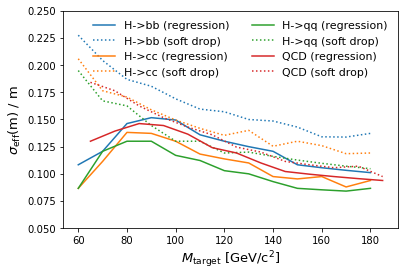

In [29]:
plt.plot(targetmasses, Hbbr, label='H->bb (regression)', c='C0')
plt.plot(targetmasses, Hbbsd, label='H->bb (soft drop)', c='C0', ls=':')
plt.plot(targetmasses, Hccr, label='H->cc (regression)', c='C1')
plt.plot(targetmasses, Hccsd, label='H->cc (soft drop)', c='C1', ls=':')
plt.plot(targetmasses, Hqqr, label='H->qq (regression)', c='C2')
plt.plot(targetmasses, Hqqsd, label='H->qq (soft drop)', c='C2', ls=':')
plt.plot(targetmasses+5, qcdr, label='QCD (regression)', c='C3')
plt.plot(targetmasses+5, qcdsd, label='QCD (soft drop)', c='C3', ls=':')
plt.legend(fontsize=11, frameon=False, ncol=2)
plt.xlabel('$M_{\\rm target}$ [GeV/${\\rm c}^2$]', fontsize=13)
plt.ylabel('$\sigma_{\\rm eff}$(m) / m', fontsize=13)
plt.ylim([0.05, 0.25])
plt.show()

In [47]:
# function for computing mass resolution
def getEffSigma(theHist, wmin=0.2, wmax=1.8, epsilon=0.01):

    point = wmin
    weight = 0.0
    points = []
    # number of all jets
    thesum = theHist.sum("sample", "mass").values()[()]

    # number of jets in each bin
    values = theHist.sum("sample").values()[()]

    # bin centers
    centers = theHist.to_hist().axes['mass'].centers

    # fill list of bin centers and the integral up to those points
    for i, value in enumerate(values):
        weight += value
        points.append([centers[i], weight / thesum])

    low = wmin
    high = wmax

    # loop over all possible bin combninations and find the one
    # with smallest width and ~68% of all jets
    width = wmax - wmin
    for i in range(len(points)):
        for j in range(i, len(points)):
            wy = points[j][1] - points[i][1]
#             print(wy)
            if abs(wy - 0.683) < epsilon:
#                 print("here")
                wx = points[j][0] - points[i][0]
#                 print(wx)
                if wx < width:
                    low = points[i][0]
                    high = points[j][0]
                    # print(points[j][0], points[i][0], wy, wx)
                    width = wx
    print(low, high)
    return 0.5 * (high - low)

targetpts = np.linspace(200, 2500, 47)
Hbbr = np.zeros(len(targetpts))
Hbbsd = np.zeros(len(targetpts))
Hccr = np.zeros(len(targetpts))
Hccsd = np.zeros(len(targetpts))
Hqqr = np.zeros(len(targetpts))
Hqqsd = np.zeros(len(targetpts))
qcdr = np.zeros(len(targetpts))
qcdsd = np.zeros(len(targetpts))

Hbbrm = np.zeros(len(targetpts))
Hbbsdm = np.zeros(len(targetpts))
Hccrm = np.zeros(len(targetpts))
Hccsdm = np.zeros(len(targetpts))
Hqqrm = np.zeros(len(targetpts))
Hqqsdm = np.zeros(len(targetpts))
qcdrm = np.zeros(len(targetpts))
qcdsdm = np.zeros(len(targetpts))

for i in range(len(targetpts)):
    targetpt = targetpts[i]
    
    # hbbr
    hbbrhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 2)
                        )

    hbbrhist.fill(sample='H->bb (regression)', 
                  mass=events.output[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_bb==1)]/events.target_mass[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_bb==1)])

    Hbbr[i] = getEffSigma(hbbrhist)
    
    values = hbbrhist.sum("sample").values()[()]
    index = np.argmax(values)
    centers = hbbrhist.to_hist().axes['mass'].centers
    Hbbrm[i] = centers[index]
    
    # hbbsd
    hbbsdhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 2)
                        )

    hbbsdhist.fill(sample='H->bb (soft drop)', 
                  mass=events.fj_msd[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_bb==1)]/events.target_mass[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_bb==1)])

    Hbbsd[i] = getEffSigma(hbbsdhist)
    
    values = hbbsdhist.sum("sample").values()[()]
    index = np.argmax(values)
    centers = hbbsdhist.to_hist().axes['mass'].centers
    Hbbsdm[i] = centers[index]
    
    # hccr
    hccrhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 2)
                        )

    hccrhist.fill(sample='H->cc (regression)', 
                  mass=events.output[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_cc==1)]/events.target_mass[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_cc==1)])

    Hccr[i] = getEffSigma(hccrhist)
    
    values = hccrhist.sum("sample").values()[()]
    index = np.argmax(values)
    centers = hccrhist.to_hist().axes['mass'].centers
    Hccrm[i] = centers[index]
    
    # hccsd
    hccsdhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 2)
                        )

    hccsdhist.fill(sample='H->cc (soft drop)', 
                  mass=events.fj_msd[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_cc==1)]/events.target_mass[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_cc==1)])

    Hccsd[i] = getEffSigma(hccsdhist)
    
    values = hccsdhist.sum("sample").values()[()]
    index = np.argmax(values)
    centers = hccsdhist.to_hist().axes['mass'].centers
    Hccsdm[i] = centers[index]
    
    # hqqr
    hqqrhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 2)
                        )

    hqqrhist.fill(sample='H->qq (regression)', 
                  mass=events.output[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_qq==1)]/events.target_mass[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_qq==1)])

    Hqqr[i] = getEffSigma(hqqrhist)
    
    values = hqqrhist.sum("sample").values()[()]
    index = np.argmax(values)
    centers = hqqrhist.to_hist().axes['mass'].centers
    Hqqrm[i] = centers[index]
    
    # hccsd
    hqqsdhist = hist.Hist("Events",
                         hist.Cat("sample", "sample name"),
                         hist.Bin("mass", "Mass", 200, 0, 2)
                        )

    hqqsdhist.fill(sample='H->qq (soft drop)', 
                  mass=events.fj_msd[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_qq==1)]/events.target_mass[((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0) & (events.label_H_qq==1)])

    Hqqsd[i] = getEffSigma(hqqsdhist)
    
    values = hqqsdhist.sum("sample").values()[()]
    index = np.argmax(values)
    centers = hqqsdhist.to_hist().axes['mass'].centers
    Hqqsdm[i] = centers[index]
    
    #qcdr
    qcdrhist = hist.Hist('Events',
                         hist.Cat('sample', 'sample name'),
                         hist.Bin('mass', 'Mass', 200, 0, 2),
                        )

    qcdrhist.fill(sample='QCD (regression)', 
                  mass=events.output[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0)]/events.fj_genjet_sdmass[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0)])
    
    qcdr[i] = getEffSigma(qcdrhist)
    
    values = qcdrhist.sum("sample").values()[()]
    index = np.argmax(values)
    centers = qcdrhist.to_hist().axes['mass'].centers
    qcdrm[i] = centers[index]
    
    #qcdsd
    qcdsdhist = hist.Hist('Events',
                         hist.Cat('sample', 'sample name'),
                         hist.Bin('mass', 'Mass', 200, 0, 2),
                        )

    qcdsdhist.fill(sample='QCD (soft drop)', 
                  mass=events.fj_msd[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0)]/events.fj_genjet_sdmass[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_pt-targetpt) < 50) & ((events.fj_pt-targetpt) >= 0)])
    
    qcdsd[i] = getEffSigma(qcdsdhist)
    
    values = qcdsdhist.sum("sample").values()[()]
    index = np.argmax(values)
    centers = qcdsdhist.to_hist().axes['mass'].centers
    qcdsdm[i] = centers[index]



0.835 1.205
0.555 0.945
0.905 1.255
0.615 1.005
0.915 1.255
0.675 1.045
0.795 1.395
0.415 1.015
0.845 1.175
0.635 1.005
0.875 1.185
0.675 1.025
0.925 1.205
0.725 1.055
0.785 1.365
0.435 1.015
0.845 1.145
0.665 1.005
0.895 1.165
0.695 1.015
0.925 1.175
0.775 1.065
0.775 1.365
0.415 1.025
0.835 1.115
0.695 1.015
0.885 1.135
0.745 1.035
0.925 1.155
0.765 1.035
0.765 1.345
0.415 1.035
0.855 1.115
0.685 0.995
0.885 1.125
0.745 1.025
0.905 1.125
0.795 1.045
0.765 1.345
0.405 1.035
0.845 1.095
0.705 1.005
0.875 1.105
0.755 1.025
0.905 1.115
0.785 1.035
0.755 1.335
0.445 1.075
0.855 1.095
0.735 1.015
0.885 1.105
0.765 1.025
0.895 1.105
0.795 1.035
0.725 1.305
0.465 1.105
0.865 1.095
0.715 1.005
0.905 1.115
0.785 1.035
0.905 1.105
0.825 1.055
0.735 1.295
0.415 1.045
0.885 1.105
0.755 1.035
0.905 1.105
0.775 1.025
0.905 1.105
0.815 1.045
0.745 1.295
0.385 1.035
0.885 1.105
0.735 1.025
0.905 1.105
0.785 1.035
0.905 1.105
0.815 1.055
0.735 1.305
0.395 1.075
0.895 1.125
0.735 1.045
0.915 1.115
0.78

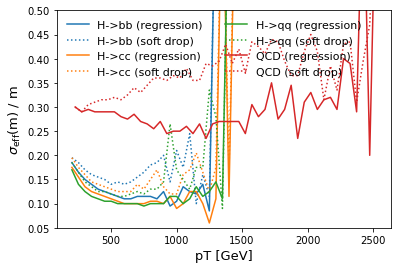

In [43]:
plt.plot(targetpts, Hbbr, label='H->bb (regression)', c='C0')
plt.plot(targetpts, Hbbsd, label='H->bb (soft drop)', c='C0', ls=':')
plt.plot(targetpts, Hccr, label='H->cc (regression)', c='C1')
plt.plot(targetpts, Hccsd, label='H->cc (soft drop)', c='C1', ls=':')
plt.plot(targetpts, Hqqr, label='H->qq (regression)', c='C2')
plt.plot(targetpts, Hqqsd, label='H->qq (soft drop)', c='C2', ls=':')
plt.plot(targetpts+25, qcdr, label='QCD (regression)', c='C3')
plt.plot(targetpts+25, qcdsd, label='QCD (soft drop)', c='C3', ls=':')
plt.legend(fontsize=11, frameon=False, ncol=2)
plt.xlabel('pT [GeV]', fontsize=13)
plt.ylabel('$\sigma_{\\rm eff}$(m) / m', fontsize=13)
plt.ylim([0.05, 0.5])
# plt.xlim([200, 800])
plt.show()

In [56]:
Hbbre = np.zeros(len(targetpts))
Hbbsde = np.zeros(len(targetpts))
Hccre = np.zeros(len(targetpts))
Hccsde = np.zeros(len(targetpts))
Hqqre = np.zeros(len(targetpts))
Hqqsde = np.zeros(len(targetpts))
qcdre = np.zeros(len(targetpts))
qcdsde = np.zeros(len(targetpts))

for i in range(len(targetpts)):
    # hbbr
    sigma_eff = Hbbr[i]
    MPV = Hbbrm[i]

    jets = len(events.output[(events.label_H_bb==1) & ((events.output/events.target_mass) > (MPV - 2 * sigma_eff)) & ((events.output/events.target_mass) < (MPV + 2 * sigma_eff))])
    Hbbre[i]=jets/len(events.output[events.label_H_bb==1])
    
    # hbbsd
    sigma_eff = Hbbsd[i]
    MPV = Hbbsdm[i]

    jets = len(events.fj_msd[(events.label_H_bb==1) & ((events.fj_msd/events.target_mass) > (MPV - 2 * sigma_eff)) & ((events.fj_msd/events.target_mass) < (MPV + 2 * sigma_eff))])
    Hbbsde[i]=jets/len(events.fj_msd[events.label_H_bb==1])
    
    # hccr
    sigma_eff = Hccr[i]
    MPV = Hccrm[i]

    jets = len(events.output[(events.label_H_cc==1) & ((events.output/events.target_mass) > (MPV - 2 * sigma_eff)) & ((events.output/events.target_mass) < (MPV + 2 * sigma_eff))])
    Hccre[i]=jets/len(events.output[events.label_H_cc==1])
    
    # hccsd
    sigma_eff = Hccsd[i]
    MPV = Hccsdm[i]

    jets = len(events.fj_msd[(events.label_H_cc==1) & ((events.fj_msd/events.target_mass) > (MPV - 2 * sigma_eff)) & ((events.fj_msd/events.target_mass) < (MPV + 2 * sigma_eff))])
    Hccsde[i]=jets/len(events.fj_msd[events.label_H_cc==1])
    
    # hqqr
    sigma_eff = Hqqr[i]
    MPV = Hqqrm[i]

    jets = len(events.output[(events.label_H_qq==1) & ((events.output/events.target_mass) > (MPV - 2 * sigma_eff)) & ((events.output/events.target_mass) < (MPV + 2 * sigma_eff))])
    Hqqre[i]=jets/len(events.output[events.label_H_qq==1])
    
    # hqqsd
    sigma_eff = Hqqsd[i]
    MPV = Hqqsdm[i]

    jets = len(events.fj_msd[(events.label_H_qq==1) & ((events.fj_msd/events.target_mass) > (MPV - 2 * sigma_eff)) & ((events.fj_msd/events.target_mass) < (MPV + 2 * sigma_eff))])
    Hqqsde[i]=jets/len(events.fj_msd[events.label_H_qq==1])
    
    # qcdr
    sigma_eff = qcdr[i]
    MPV = qcdrm[i]

    jets = len(events.output[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.output/events.fj_genjet_sdmass) > (MPV - 2 * sigma_eff)) & ((events.output/events.fj_genjet_sdmass) < (MPV + 2 * sigma_eff))])
    qcdre[i]=jets/len(events.output[(events.sample_isQCD==1) & (events.label_QCD_all==1)])
    
    # qcdsd
    sigma_eff = qcdsd[i]
    MPV = qcdsdm[i]

    jets = len(events.fj_msd[(events.sample_isQCD==1) & (events.label_QCD_all==1) & ((events.fj_msd/events.fj_genjet_sdmass) > (MPV - 2 * sigma_eff)) & ((events.fj_msd/events.fj_genjet_sdmass) < (MPV + 2 * sigma_eff))])
    qcdsde[i]=jets/len(events.fj_msd[(events.sample_isQCD==1) & (events.label_QCD_all==1)])

    

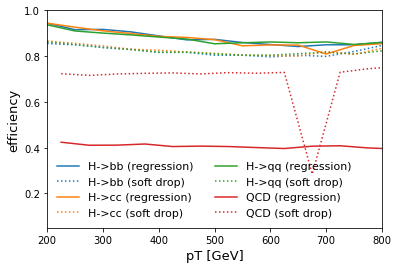

In [61]:
plt.plot(targetpts, Hbbre, label='H->bb (regression)', c='C0')
plt.plot(targetpts, Hbbsde, label='H->bb (soft drop)', c='C0', ls=':')
plt.plot(targetpts, Hccre, label='H->cc (regression)', c='C1')
plt.plot(targetpts, Hccsde, label='H->cc (soft drop)', c='C1', ls=':')
plt.plot(targetpts, Hqqre, label='H->qq (regression)', c='C2')
plt.plot(targetpts, Hqqsde, label='H->qq (soft drop)', c='C2', ls=':')
plt.plot(targetpts+25, qcdre, label='QCD (regression)', c='C3')
plt.plot(targetpts+25, qcdsde, label='QCD (soft drop)', c='C3', ls=':')
plt.legend(fontsize=11, frameon=False, ncol=2)
plt.xlabel('pT [GeV]', fontsize=13)
plt.ylabel('efficiency', fontsize=13)
plt.ylim([0.05, 1])
plt.xlim([200, 800])
plt.show()

## Attempted optimized learning rate ##

In [2]:
fname = '/work/training_output/20220704-143206_model_config_ranger_lr0.7_batch512/predict_output/pred.root'
events = NanoEventsFactory.from_root(fname, treepath='Events', schemaclass=BaseSchema).events()

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

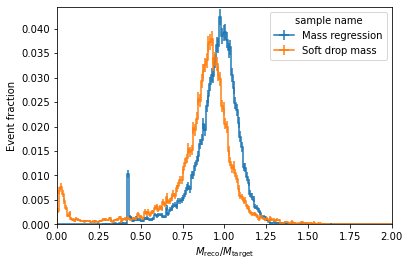

In [3]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'sample name'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[events.fj_gen_mass==targetmass]/events.target_mass[events.fj_gen_mass==targetmass])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[events.fj_gen_mass==targetmass]/events.target_mass[events.fj_gen_mass==targetmass])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[events.fj_gen_mass==targetmass]), 'Soft drop mass': 1/len(events.event_no[events.fj_gen_mass==targetmass])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

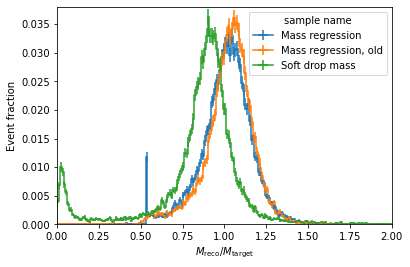

In [15]:
targetmass = 120

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'sample name'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[events.fj_gen_mass==targetmass]/events.target_mass[events.fj_gen_mass==targetmass])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[events.fj_gen_mass==targetmass]/events.target_mass[events.fj_gen_mass==targetmass])
mass.fill(sample='Mass regression, old', mass=events5.output[events5.fj_gen_mass==targetmass]/events5.target_mass[events5.fj_gen_mass==targetmass])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[events.fj_gen_mass==targetmass]), 'Mass regression, old': 1/len(events5.event_no[events5.fj_gen_mass==targetmass]), 'Soft drop mass': 1/len(events.event_no[events.fj_gen_mass==targetmass])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

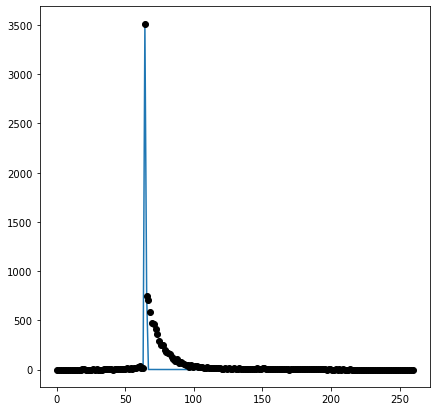

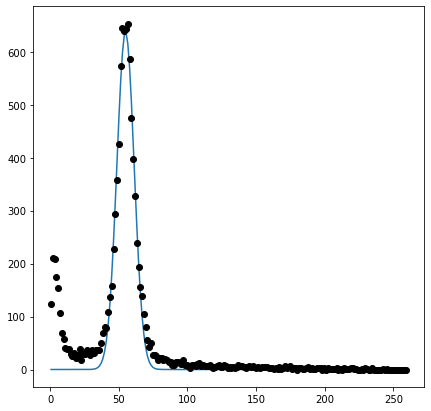

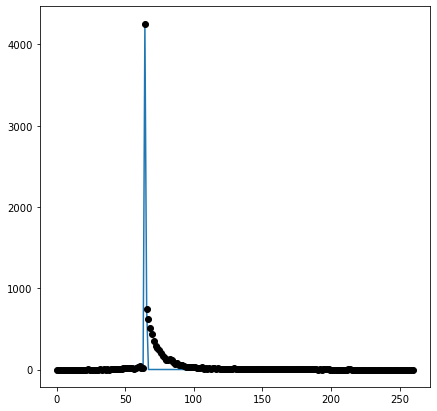

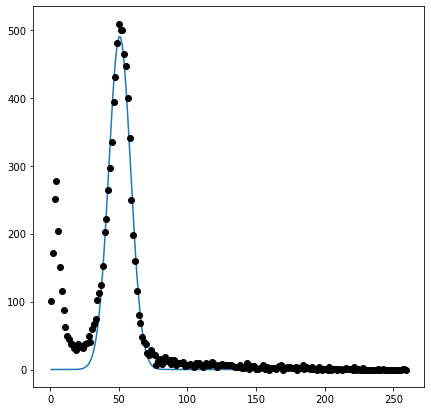

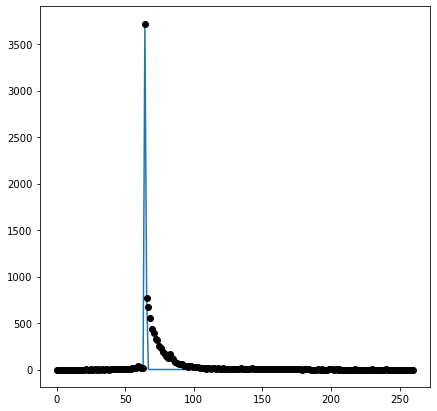

...

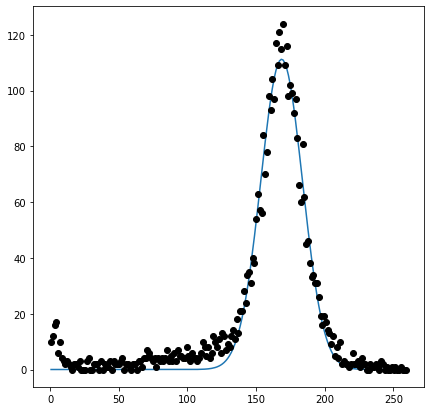

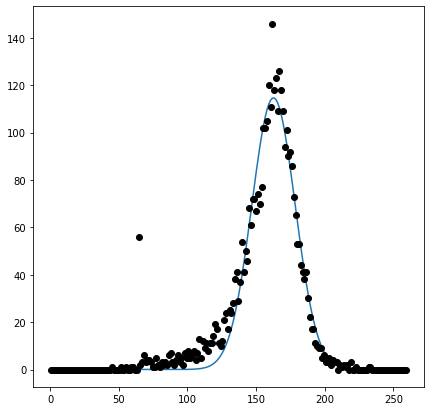

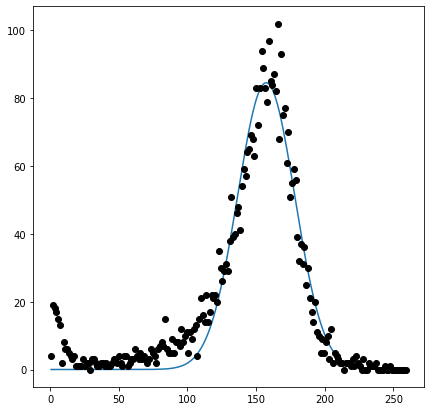

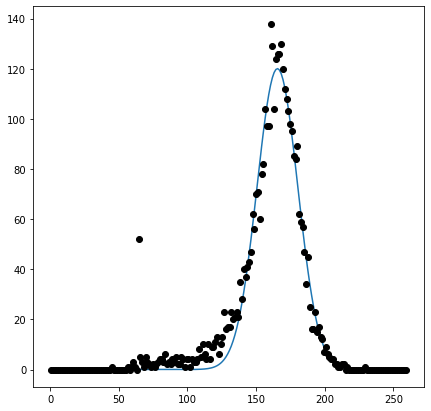

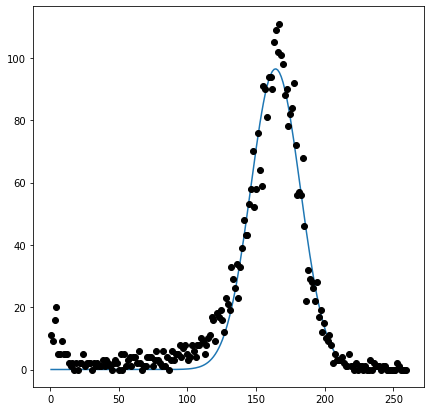

In [7]:
targetmasses = [60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180]
masshists = {}

for targetmass in targetmasses:
    masshist = hist.Hist('Events',
                         hist.Cat('sample', 'Higgs to qq'),
                         hist.Bin('mass', 'Mass', 200, 0, 260),
                        )

    masshist.fill(sample='H->qq (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])
    masshist.fill(sample='H->qq (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_qq==1)])
    
    masshist.fill(sample='H->bb (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
    masshist.fill(sample='H->bb (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
    
    masshist.fill(sample='H->cc (regression)', 
                  mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])
    masshist.fill(sample='H->cc (soft drop)', 
                  mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_cc==1)])
    
    masshists[targetmass] = masshist
    
Hbbr = np.zeros(len(targetmasses))
Hbbsd = np.zeros(len(targetmasses))
Hccr = np.zeros(len(targetmasses))
Hccsd = np.zeros(len(targetmasses))
Hqqr = np.zeros(len(targetmasses))
Hqqsd = np.zeros(len(targetmasses))

Hdict = {'H->bb (regression)': Hbbr, 'H->bb (soft drop)': Hbbsd,
        'H->cc (regression)': Hccr, 'H->cc (soft drop)': Hccsd,
        'H->qq (regression)': Hqqr, 'H->qq (soft drop)': Hqqsd}

for i in range(len(targetmasses)):
    targetmass = targetmasses[i]
    masshist = masshists[targetmass]
    x = masshist.axes()[1].centers()
    samplenames = list(masshist.values().keys())
    
    for sample in samplenames:
        y = masshist.values()[sample]
        samplename = sample[0]
        
        p, perr = gaussfit(x, y)
        
        sigma_eff = np.abs(p[2])
        
        Hdict[samplename][i] = sigma_eff/targetmass

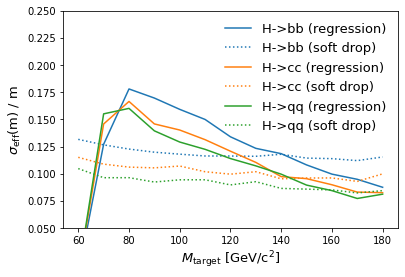

In [8]:
plt.plot(targetmasses, Hbbr, label='H->bb (regression)', c='C0')
plt.plot(targetmasses, Hbbsd, label='H->bb (soft drop)', c='C0', ls=':')
plt.plot(targetmasses, Hccr, label='H->cc (regression)', c='C1')
plt.plot(targetmasses, Hccsd, label='H->cc (soft drop)', c='C1', ls=':')
plt.plot(targetmasses, Hqqr, label='H->qq (regression)', c='C2')
plt.plot(targetmasses, Hqqsd, label='H->qq (soft drop)', c='C2', ls=':')
plt.legend(fontsize=13, frameon=False)
plt.xlabel('$M_{\\rm target}$ [GeV/${\\rm c}^2$]', fontsize=13)
plt.ylabel('$\sigma_{\\rm eff}$(m) / m', fontsize=13)
plt.ylim([0.05, 0.25])
plt.show()

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

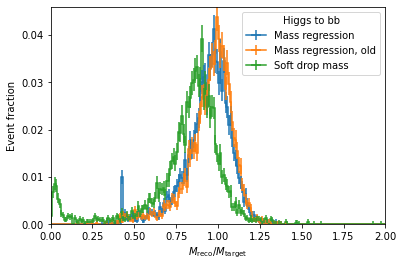

In [23]:
targetmass = 150

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'Higgs to bb'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)]/events.target_mass[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])
mass.fill(sample='Mass regression, old', mass=events5.output[(events5.fj_gen_mass==targetmass) & (events5.label_H_bb==1)]/events5.target_mass[(events5.fj_gen_mass==targetmass) & (events5.label_H_bb==1)])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)]), 'Mass regression, old': 1/len(events5.event_no[(events5.fj_gen_mass==targetmass) & (events5.label_H_bb==1)]), 'Soft drop mass': 1/len(events.event_no[(events.fj_gen_mass==targetmass) & (events.label_H_bb==1)])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

## Testing 3 different learning rates ##

In [6]:
fname = '/work/training_output/20220706-140651_model_config_ranger_lr0.005_batch512/predict_output/pred.root'
events = NanoEventsFactory.from_root(fname, treepath='Events', schemaclass=BaseSchema).events()

In [7]:
fname = '/work/training_output/20220707-165254_model_config_ranger_lr0.002_batch512/predict_output/pred.root'
events_small = NanoEventsFactory.from_root(fname, treepath='Events', schemaclass=BaseSchema).events()

In [8]:
fname = '/work/training_output/20220707-203539_model_config_ranger_lr0.01_batch512/predict_output/pred.root'
events_large = NanoEventsFactory.from_root(fname, treepath='Events', schemaclass=BaseSchema).events()

<AxesSubplot:xlabel='$M_{\\rm reco}$/$M_{\\rm target}$', ylabel='Event fraction'>

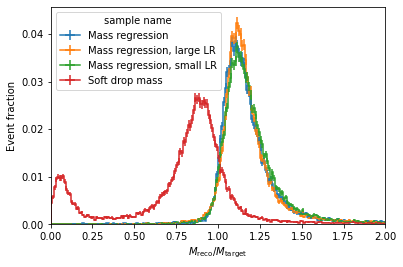

In [18]:
targetmass = 60

mass = hist.Hist('Event fraction',
                 hist.Cat('sample', 'sample name'),
                 hist.Bin('mass', '$M_{\\rm reco}$/$M_{\\rm target}$', 200, 0, 2),
                )

mass.fill(sample='Mass regression', mass=events.output[events.fj_gen_mass==targetmass]/events.target_mass[events.fj_gen_mass==targetmass])
mass.fill(sample='Mass regression, small LR', mass=events_small.output[events_small.fj_gen_mass==targetmass]/events_small.target_mass[events_small.fj_gen_mass==targetmass])
mass.fill(sample='Mass regression, large LR', mass=events_large.output[events_large.fj_gen_mass==targetmass]/events_large.target_mass[events_large.fj_gen_mass==targetmass])
mass.fill(sample='Soft drop mass', mass=events.fj_msd[events.fj_gen_mass==targetmass]/events.target_mass[events.fj_gen_mass==targetmass])

# am not sure this is the correct way to do events fraction
scales = {'Mass regression': 1/len(events.event_no[events.fj_gen_mass==targetmass]), 'Mass regression, small LR': 1/len(events_small.event_no[events_small.fj_gen_mass==targetmass]), 'Mass regression, large LR': 1/len(events_large.event_no[events_large.fj_gen_mass==targetmass]), 'Soft drop mass': 1/len(events.event_no[events.fj_gen_mass==targetmass])}
mass.scale(scales, axis='sample')

hist.plot1d(mass, overlay='sample')

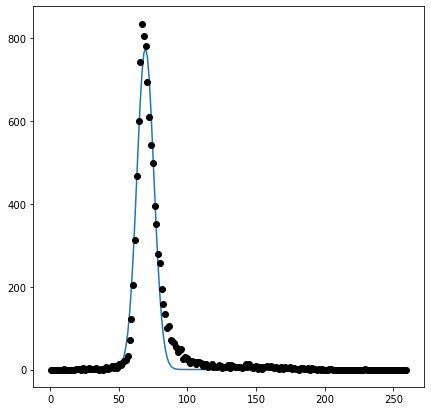

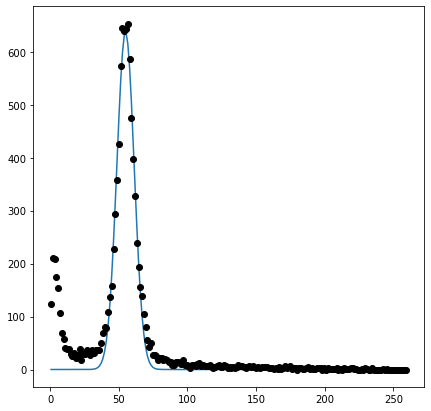

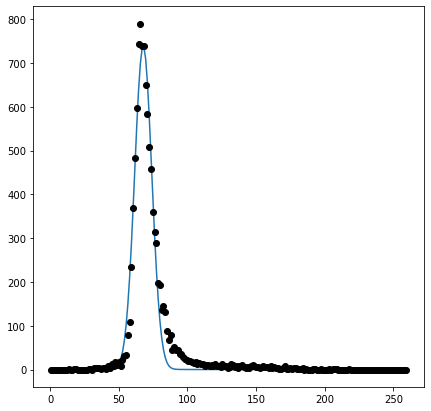

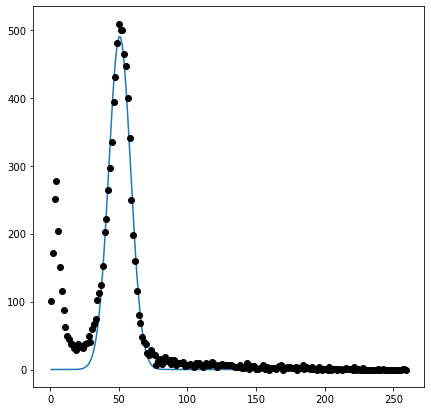

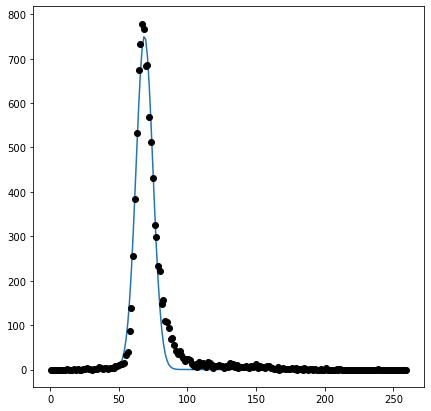

...

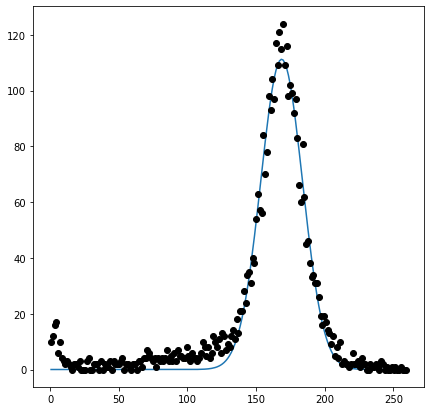

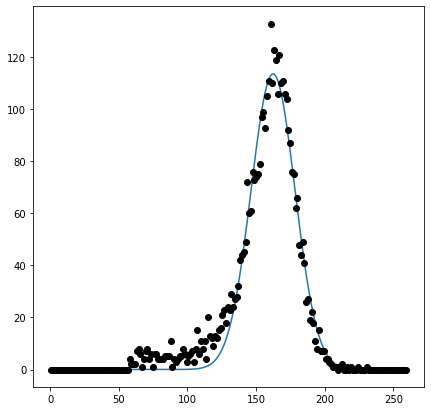

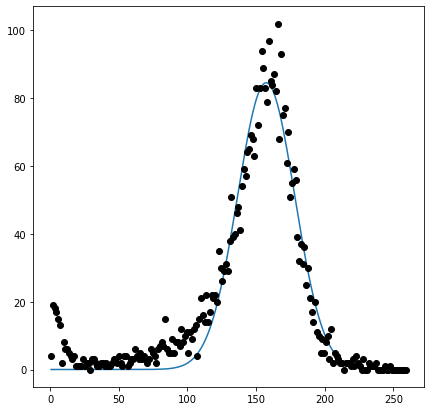

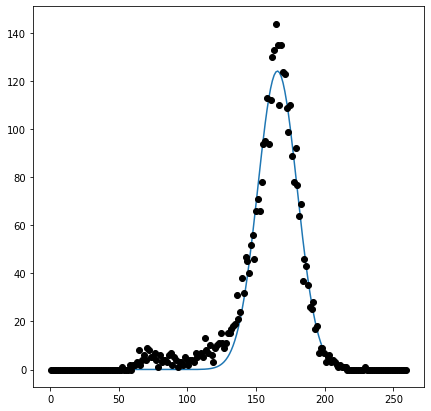

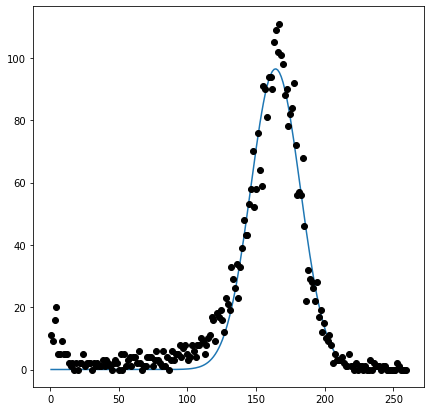

In [10]:
targetmasses = [60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180]
masshists = {}

for targetmass in targetmasses:
    masshist = hist.Hist('Events',
                         hist.Cat('sample', 'Higgs to qq'),
                         hist.Bin('mass', 'Mass', 200, 0, 260),
                        )

    masshist.fill(sample='H->qq (regression)', 
                  mass=events_small.output[(events_small.fj_gen_mass==targetmass) & (events_small.label_H_qq==1)])
    masshist.fill(sample='H->qq (soft drop)', 
                  mass=events_small.fj_msd[(events_small.fj_gen_mass==targetmass) & (events_small.label_H_qq==1)])
    
    masshist.fill(sample='H->bb (regression)', 
                  mass=events_small.output[(events_small.fj_gen_mass==targetmass) & (events_small.label_H_bb==1)])
    masshist.fill(sample='H->bb (soft drop)', 
                  mass=events_small.fj_msd[(events_small.fj_gen_mass==targetmass) & (events_small.label_H_bb==1)])
    
    masshist.fill(sample='H->cc (regression)', 
                  mass=events_small.output[(events_small.fj_gen_mass==targetmass) & (events_small.label_H_cc==1)])
    masshist.fill(sample='H->cc (soft drop)', 
                  mass=events_small.fj_msd[(events_small.fj_gen_mass==targetmass) & (events_small.label_H_cc==1)])
    
    masshists[targetmass] = masshist
    
Hbbr = np.zeros(len(targetmasses))
Hbbsd = np.zeros(len(targetmasses))
Hccr = np.zeros(len(targetmasses))
Hccsd = np.zeros(len(targetmasses))
Hqqr = np.zeros(len(targetmasses))
Hqqsd = np.zeros(len(targetmasses))

Hdict = {'H->bb (regression)': Hbbr, 'H->bb (soft drop)': Hbbsd,
        'H->cc (regression)': Hccr, 'H->cc (soft drop)': Hccsd,
        'H->qq (regression)': Hqqr, 'H->qq (soft drop)': Hqqsd}

for i in range(len(targetmasses)):
    targetmass = targetmasses[i]
    masshist = masshists[targetmass]
    x = masshist.axes()[1].centers()
    samplenames = list(masshist.values().keys())
    
    for sample in samplenames:
        y = masshist.values()[sample]
        samplename = sample[0]
        
        p, perr = gaussfit(x, y)
        
        sigma_eff = np.abs(p[2])
        
        Hdict[samplename][i] = sigma_eff/targetmass

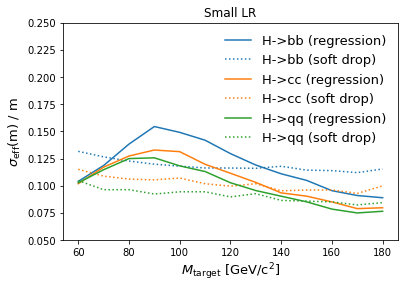

In [11]:
plt.plot(targetmasses, Hbbr, label='H->bb (regression)', c='C0')
plt.plot(targetmasses, Hbbsd, label='H->bb (soft drop)', c='C0', ls=':')
plt.plot(targetmasses, Hccr, label='H->cc (regression)', c='C1')
plt.plot(targetmasses, Hccsd, label='H->cc (soft drop)', c='C1', ls=':')
plt.plot(targetmasses, Hqqr, label='H->qq (regression)', c='C2')
plt.plot(targetmasses, Hqqsd, label='H->qq (soft drop)', c='C2', ls=':')
plt.legend(fontsize=13, frameon=False)
plt.xlabel('$M_{\\rm target}$ [GeV/${\\rm c}^2$]', fontsize=13)
plt.ylabel('$\sigma_{\\rm eff}$(m) / m', fontsize=13)
plt.ylim([0.05, 0.25])
plt.title('Small LR')
plt.show()

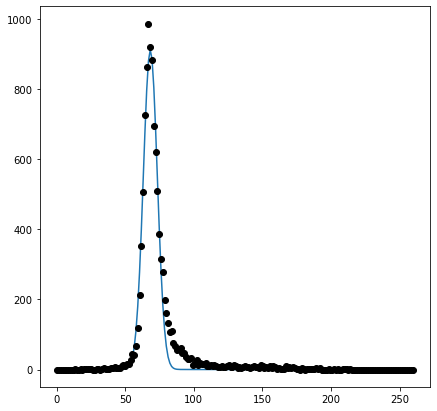

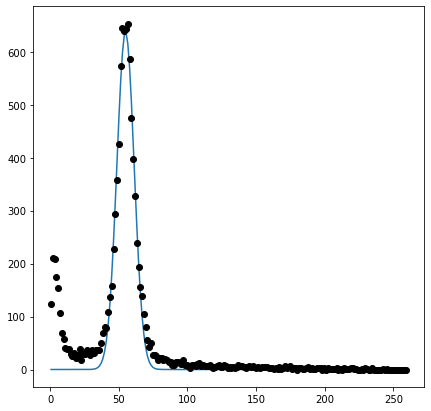

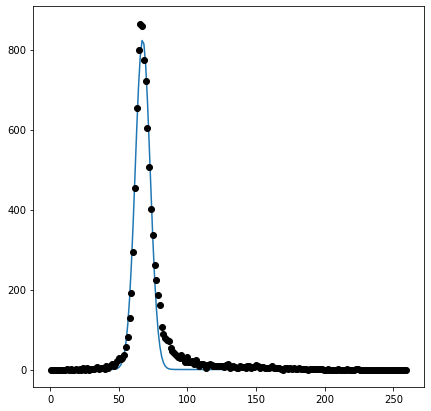

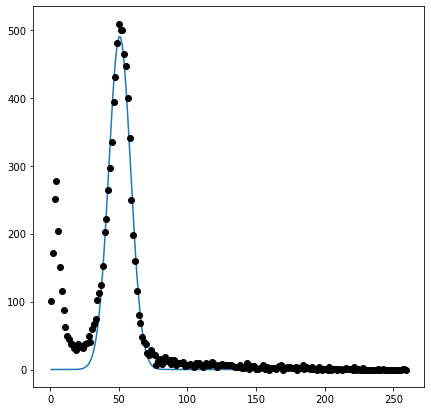

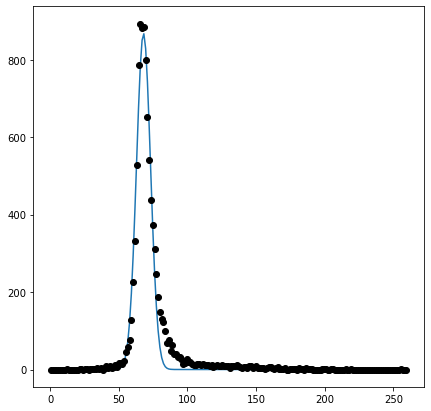

...

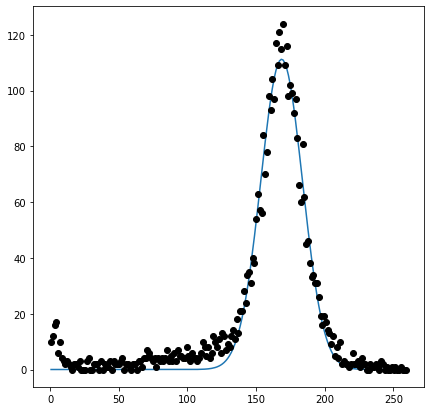

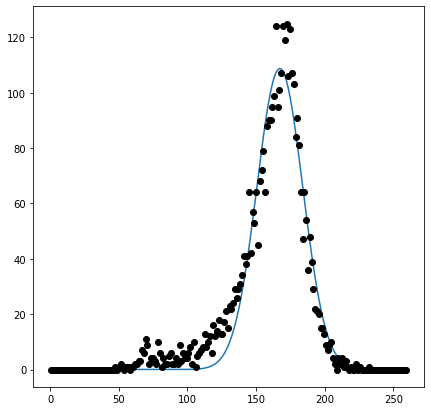

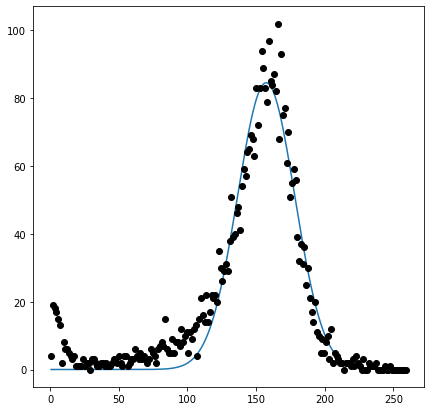

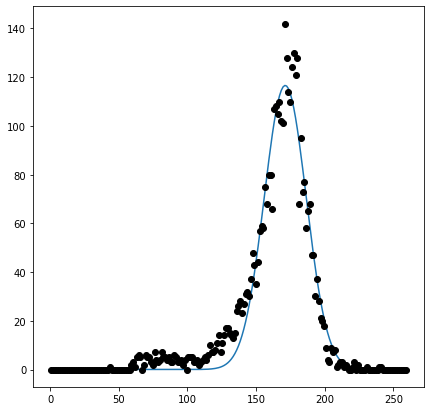

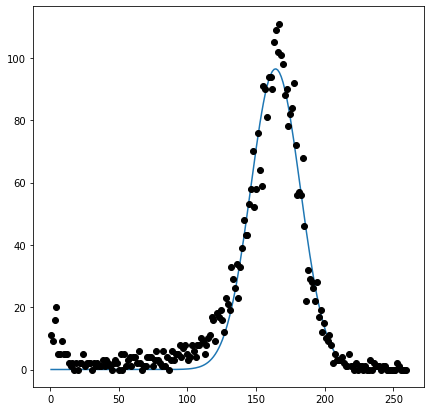

In [12]:
targetmasses = [60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180]
masshists = {}

for targetmass in targetmasses:
    masshist = hist.Hist('Events',
                         hist.Cat('sample', 'Higgs to qq'),
                         hist.Bin('mass', 'Mass', 200, 0, 260),
                        )

    masshist.fill(sample='H->qq (regression)', 
                  mass=events_large.output[(events_large.fj_gen_mass==targetmass) & (events_large.label_H_qq==1)])
    masshist.fill(sample='H->qq (soft drop)', 
                  mass=events_large.fj_msd[(events_large.fj_gen_mass==targetmass) & (events_large.label_H_qq==1)])
    
    masshist.fill(sample='H->bb (regression)', 
                  mass=events_large.output[(events_large.fj_gen_mass==targetmass) & (events_large.label_H_bb==1)])
    masshist.fill(sample='H->bb (soft drop)', 
                  mass=events_large.fj_msd[(events_large.fj_gen_mass==targetmass) & (events_large.label_H_bb==1)])
    
    masshist.fill(sample='H->cc (regression)', 
                  mass=events_large.output[(events_large.fj_gen_mass==targetmass) & (events_large.label_H_cc==1)])
    masshist.fill(sample='H->cc (soft drop)', 
                  mass=events_large.fj_msd[(events_large.fj_gen_mass==targetmass) & (events_large.label_H_cc==1)])
    
    masshists[targetmass] = masshist
    
Hbbr = np.zeros(len(targetmasses))
Hbbsd = np.zeros(len(targetmasses))
Hccr = np.zeros(len(targetmasses))
Hccsd = np.zeros(len(targetmasses))
Hqqr = np.zeros(len(targetmasses))
Hqqsd = np.zeros(len(targetmasses))

Hdict = {'H->bb (regression)': Hbbr, 'H->bb (soft drop)': Hbbsd,
        'H->cc (regression)': Hccr, 'H->cc (soft drop)': Hccsd,
        'H->qq (regression)': Hqqr, 'H->qq (soft drop)': Hqqsd}

for i in range(len(targetmasses)):
    targetmass = targetmasses[i]
    masshist = masshists[targetmass]
    x = masshist.axes()[1].centers()
    samplenames = list(masshist.values().keys())
    
    for sample in samplenames:
        y = masshist.values()[sample]
        samplename = sample[0]
        
        p, perr = gaussfit(x, y)
        
        sigma_eff = np.abs(p[2])
        
        Hdict[samplename][i] = sigma_eff/targetmass

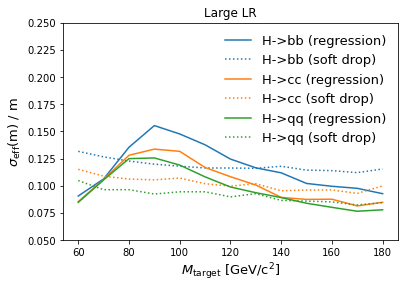

In [13]:
plt.plot(targetmasses, Hbbr, label='H->bb (regression)', c='C0')
plt.plot(targetmasses, Hbbsd, label='H->bb (soft drop)', c='C0', ls=':')
plt.plot(targetmasses, Hccr, label='H->cc (regression)', c='C1')
plt.plot(targetmasses, Hccsd, label='H->cc (soft drop)', c='C1', ls=':')
plt.plot(targetmasses, Hqqr, label='H->qq (regression)', c='C2')
plt.plot(targetmasses, Hqqsd, label='H->qq (soft drop)', c='C2', ls=':')
plt.legend(fontsize=13, frameon=False)
plt.xlabel('$M_{\\rm target}$ [GeV/${\\rm c}^2$]', fontsize=13)
plt.ylabel('$\sigma_{\\rm eff}$(m) / m', fontsize=13)
plt.ylim([0.05, 0.25])
plt.title('Large LR')
plt.show()

In [30]:
kwargs = {'test': 0}
kwargs.get('loss_mode', 3)
# kwargs['loss_mode']

3